In [1]:
import pandas as pd
import numpy as np
import scipy
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE
from sklearn.cluster import *

def visualize_clusters(clus_l):
    #NEW METADATA SELECTED!
    metadata_used = ["Period", "Duration", "Time of Transit Epoch", "r/R", "a/R",
                     "Inclination", "Impact Parameter", 
                     "Fitted Stellar Density","Teq",
                     "Limb Darkening Coeff1", "Limb Darkening Coeff2",
                    "Teff","Stellar Radius", "Stellar Mass"]

    df_meta_obj = df_meta[metadata_used]

    scaler_meta = StandardScaler()
    scaler_meta.fit(df_meta_obj.values)

    
    mask_noise = (clus_l==-1)
    K = np.max(clus_l) +1

    n_s = 5

    N_is = []
    conf_ratios = []
    cand_ratios = []
    mean_metadatas = []
    for i in range(K):
        mask_i = (clus_l==i)

        N_i = np.sum(mask_i*1)
        N_is.append(N_i)
        conf_ratio = np.sum(all_labels[mask_i]=="CONFIRMED") 
        CONF_ratio = conf_ratio/(conf_ratio+np.sum(all_labels[mask_i]=="FALSE POSITIVE")) #over conf and FP
        conf_ratios.append(CONF_ratio)
        CAND_ratio = np.sum(all_labels[mask_i]=="CANDIDATE")/N_i #total
        cand_ratios.append(CAND_ratio)
        metadata_i = df_meta_obj[mask_i]
        mean_metadata = metadata_i.mean().to_frame().T
        mean_metadatas.append(mean_metadata)

        aux = metadata_i.copy()
        aux[:] = scaler_meta.transform(metadata_i)
        plt.figure(figsize=(17,5))
        sns.boxplot(data=aux)
        plt.title("Metadata normalized boxplot of cluster "+str(i))
        plt.show()

        idx_i = np.arange(x_lc.shape[0])[mask_i]
        idx_i_sampled = np.random.choice(idx_i,size=n_s,replace=False)

        f, axx = plt.subplots(1, n_s, sharex=False, sharey=True,figsize= (17,5))
        for n in range(n_s):
            axx[n].plot(x_lc[idx_i_sampled[n]])
        #plt.ylim(-1)
        f.suptitle("Curvas de luz muestreadas (RAW) - cluster "+str(i), fontsize="x-large")
        plt.show()

        X_aux = x_lc/x_lc.std(axis=1, keepdims=True)
        f, axx = plt.subplots(1, n_s, sharex=False, sharey=True,figsize= (17,5))
        for n in range(n_s):
            axx[n].plot(X_aux[idx_i_sampled[n]])
        f.suptitle("Curvas de luz muestreadas normalizadas - cluster "+str(i), fontsize="x-large")
        plt.show()
    
    df_clus_i = pd.DataFrame({'#data':N_is, 'CONF_ratio':conf_ratios,'CAND_ratio':cand_ratios})
    df_clus_i = pd.concat([df_clus_i, pd.concat(mean_metadatas,ignore_index=True)], axis=1)
    return df_clus_i


def visualize_clusters_conf(clus_l):
    #NEW METADATA SELECTED!
    metadata_used = ["Period", "Duration", "Time of Transit Epoch", "r/R", "a/R",
                     "Inclination", "Impact Parameter", 
                     "Fitted Stellar Density","Teq",
                     "Limb Darkening Coeff1", "Limb Darkening Coeff2",
                    "Teff","Stellar Radius", "Stellar Mass"]

    df_meta_obj = df_meta[metadata_used][mask_C]

    scaler_meta = StandardScaler()
    scaler_meta.fit(df_meta_obj.values)

    
    mask_noise = (clus_l==-1)
    K = np.max(clus_l) +1

    n_s = 5

    N_is = []
    conf_ratios = []
    cand_ratios = []
    mean_metadatas = []
    for i in range(K):
        mask_i = (clus_l==i)

        N_i = np.sum(mask_i*1)
        N_is.append(N_i)
        metadata_i = df_meta_obj[mask_i]
        mean_metadata = metadata_i.mean().to_frame().T
        mean_metadatas.append(mean_metadata)

        aux = metadata_i.copy()
        aux[:] = scaler_meta.transform(metadata_i)
        plt.figure(figsize=(17,5))
        sns.boxplot(data=aux)
        plt.title("Metadata normalized boxplot of cluster "+str(i))
        plt.show()

        idx_i = np.arange(x_lc[mask_C].shape[0])[mask_i]
        idx_i_sampled = np.random.choice(idx_i,size=n_s,replace=False)

        f, axx = plt.subplots(1, n_s, sharex=False, sharey=True,figsize= (17,5))
        for n in range(n_s):
            axx[n].plot(x_lc[mask_C][idx_i_sampled[n]])
        #plt.ylim(-1)
        f.suptitle("Curvas de luz muestreadas (RAW) - cluster "+str(i), fontsize="x-large")
        plt.show()

        X_aux = x_lc/x_lc.std(axis=1, keepdims=True)
        f, axx = plt.subplots(1, n_s, sharex=False, sharey=True,figsize= (17,5))
        for n in range(n_s):
            axx[n].plot(X_aux[mask_C][idx_i_sampled[n]])
        f.suptitle("Curvas de luz muestreadas normalizadas - cluster "+str(i), fontsize="x-large")
        plt.show()
    
    df_clus_i = pd.DataFrame({'#data':N_is})
    df_clus_i = pd.concat([df_clus_i, pd.concat(mean_metadatas,ignore_index=True)], axis=1)
    return df_clus_i


def transform_plot(model, data, all_labels, just_plot=False):
    if just_plot:
        to_plot = data
    else:
        to_plot = model.fit_transform(data)
    
    plt.figure(figsize=(10,7))
    mask_ = (all_labels=="CONFIRMED")
    plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="CONFIRMED", alpha=0.7)

    mask_ = (all_labels=="FALSE POSITIVE")
    plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="FALSE", alpha=0.3)

    plt.legend()
    plt.show()

    return to_plot
model = KernelPCA(2, kernel='rbf', gamma=None, n_jobs=-1)
to_plot = transform_plot(model, x_all, all_labels)

#tsne
model = TSNE(2, metric='euclidean', n_jobs=-1)
to_plot = transform_plot(model, x_all, all_labels)

In [2]:
def visualize_dims(data, all_labels):
    mask_c = (all_labels=="CONFIRMED")
    mask_f = (all_labels=="FALSE POSITIVE")
    
    model = KernelPCA(2, kernel='rbf', gamma=None, n_jobs=-1)
    to_plot_kpca = model.fit_transform(data)
    
    model = TSNE(2, metric='euclidean', n_jobs=-1)
    to_plot_tsne = model.fit_transform(data)
    
    f, axx = plt.subplots(1, 2,figsize= (17,7))
    
    axx[0].scatter(to_plot_kpca[:,0][mask_c],to_plot_kpca[:,1][mask_c], label="CONFIRMED", alpha=0.7)
    axx[0].scatter(to_plot_kpca[:,0][mask_f],to_plot_kpca[:,1][mask_f], label="FALSE", alpha=0.3)
    axx[0].legend()
    axx[0].set_title("K-PCA visualize")
    
    axx[1].scatter(to_plot_tsne[:,0][mask_c],to_plot_tsne[:,1][mask_c], label="CONFIRMED", alpha=0.7)
    axx[1].scatter(to_plot_tsne[:,0][mask_f],to_plot_tsne[:,1][mask_f], label="FALSE", alpha=0.3)
    axx[1].legend()      
    axx[1].set_title("TSNE visualize")
                                     
    plt.show()

    return to_plot_kpca, to_plot_tsne

from autoencoder_utils import MI_between, NMI_between

Using TensorFlow backend.
/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16

In [3]:
df_meta = pd.read_csv("../../KOI_Data/kepler_dataset.csv")
df_meta["Duration"] = df_meta["Duration"]/24

all_labels = df_meta["NExScI Disposition"].values


latent_dim = 16 #o 32
T = 300 #unico ejecuutado

### Curva de luz Folded-Global

data shape= (8054, 600)


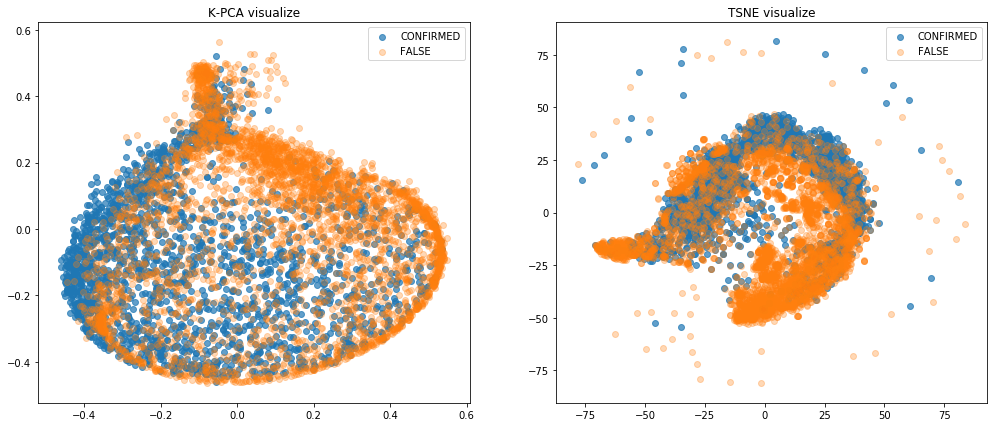

In [4]:
x_lc = np.load("../obj4/data/LC_global_%dT.npy"%T)
x_lc_s = x_lc/x_lc.std(axis=1, keepdims=True)
x_t = np.load("../obj4/data/Time_global_%dT.npy"%T)

x_all = np.concatenate([x_lc_s,x_t], axis=-1)
print("data shape=",x_all.shape)

to_plot_kpca, to_plot_tsne = visualize_dims(x_all, all_labels)

In [5]:
from sklearn.decomposition import PCA
model = PCA(16)
new_x_all = model.fit_transform(x_all)
new_x_all.shape

(8054, 16)

In [29]:
cluster_meas(new_x_all, tipo='PCA')

Cluster encontrados = 4
>> Con DBSCAN 
Silhouette (-1,1) + mejor =  0.6131727565773879
davies_bouldin (0, infty) -mejor =  0.6209782019528416
>> Con Birch K=2 
Silhouette (-1,1) + mejor =  0.13843762296315984
davies_bouldin (0, infty) -mejor =  2.642437637002676
>> Con Birch K=3 
Silhouette (-1,1) + mejor =  0.10644522560246311
davies_bouldin (0, infty) -mejor =  2.836295082083582


### Metadata

data shape= (8054, 10)


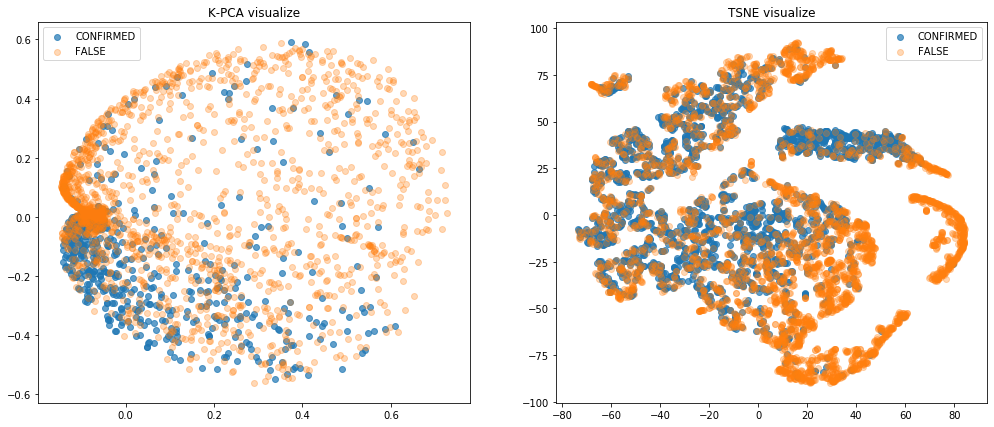

In [8]:
x_all_meta=np.load("../obj4/LC_features/MetadataLC.npy")

print("data shape=",x_all_meta.shape)
aux = pd.DataFrame(x_all_meta)

to_plot_kpca, to_plot_tsne = visualize_dims(x_all_meta, all_labels)

In [33]:
cluster_meas(x_all_meta, tipo='meta')

Cluster encontrados = 3
>> Con DBSCAN 
Silhouette (-1,1) + mejor =  0.17060765336627726
davies_bouldin (0, infty) -mejor =  0.8261831795747138
>> Con Birch K=2 
Silhouette (-1,1) + mejor =  0.4694297727308271
davies_bouldin (0, infty) -mejor =  1.2090151075026152
>> Con Birch K=3 
Silhouette (-1,1) + mejor =  0.4707435824535455
davies_bouldin (0, infty) -mejor =  1.1327617554365246


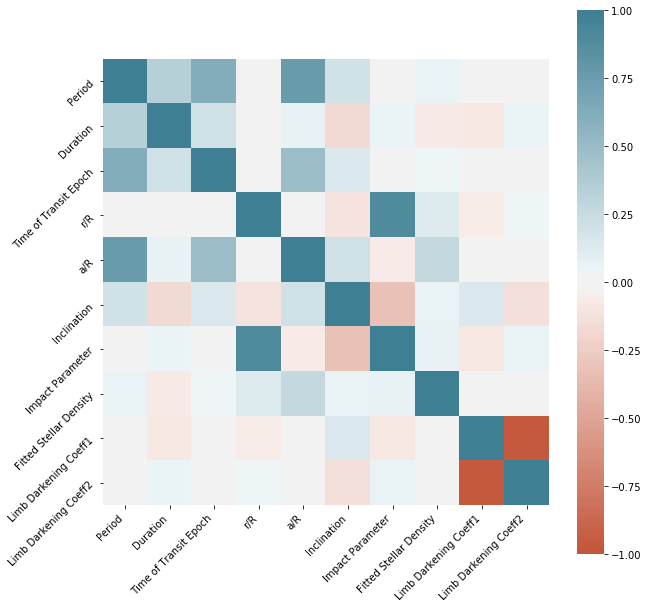

promedio corr 0.06352184694933764
promedio corr abs 0.1615344772834696


In [15]:
names_m = ['Period', 'Duration', 'Time of Transit Epoch', 'r/R', 'a/R',
       'Inclination', 'Impact Parameter', 'Fitted Stellar Density',
       'Limb Darkening Coeff1', 'Limb Darkening Coeff2']

corr = aux.corr()

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    names_m,
    rotation=45,
    horizontalalignment='right'
)
ax.set_yticklabels(
    names_m,
    rotation=45,
    horizontalalignment='right'
)
plt.show()

a = corr.values
np.fill_diagonal(a, np.nan)

print("promedio corr",np.nanmean( a))
print("promedio corr abs",np.nanmean( np.abs(a)))

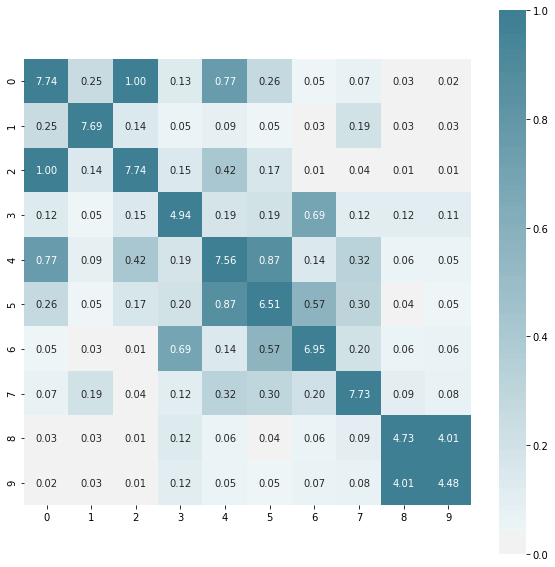

promedio MI 0.2743656808809024


In [16]:
mut_inf = MI_between(x_all_meta, x_all_meta)

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    mut_inf, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, fmt=".2f",
)
plt.show()

a = mut_inf.copy()
np.fill_diagonal(a, np.nan)

print("promedio MI",np.nanmean( a))

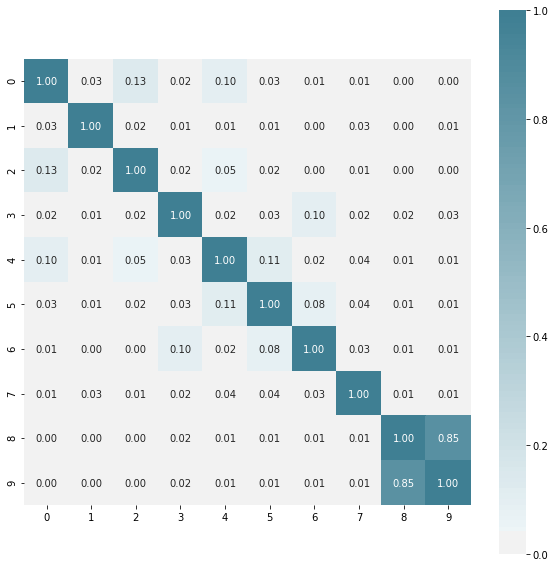

promedio Norm-MI 0.043906030787399804


In [17]:
Nmut_inf = NMI_between(x_all_meta, x_all_meta, version=1)

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    Nmut_inf, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, fmt=".2f",
)
plt.show()

a = Nmut_inf.copy()
np.fill_diagonal(a, np.nan)

print("promedio Norm-MI",np.nanmean( a))

### FOURIER + PCA

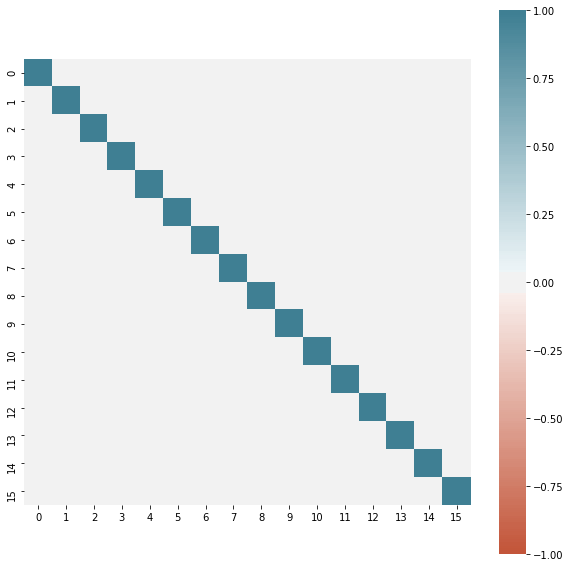

promedio corr -2.879947356122345e-17
promedio corr abs 1.2661386954732905e-16


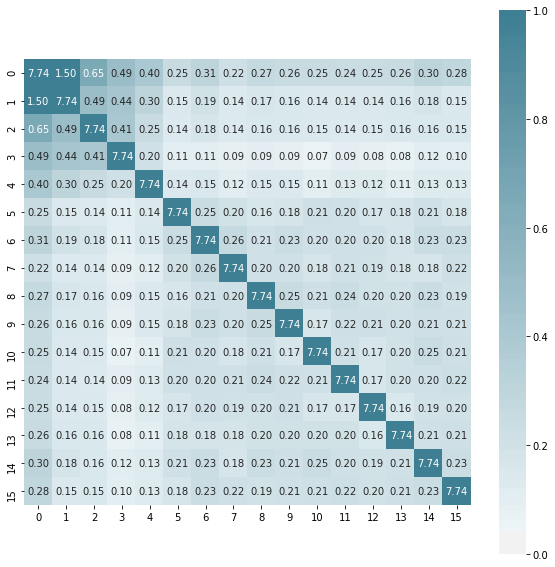

promedio MI 0.2095683639925311


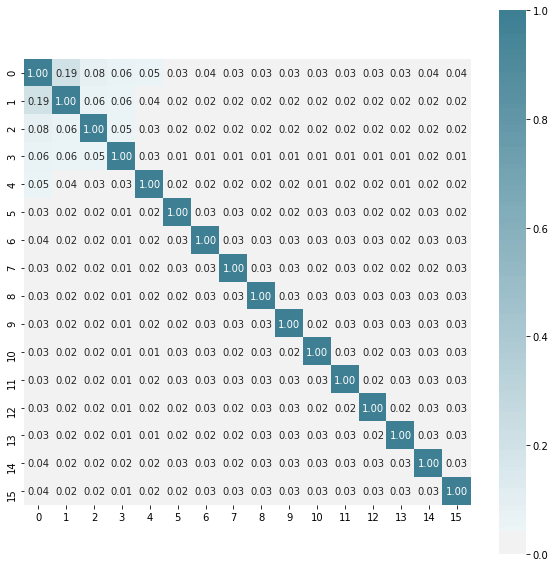

promedio Norm-MI 0.027083944787362417


In [18]:
x_all = np.load("../obj4/LC_features/FourierPCA_71427T_32D.npy")
x_all = x_all[:,:16]

aux = pd.DataFrame(x_all)
corr = aux.corr()
plt.figure(figsize=(10,10))
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
plt.show()

a = corr.values
np.fill_diagonal(a, np.nan)

print("promedio corr",np.nanmean( a))
print("promedio corr abs",np.nanmean( np.abs(a)))

mut_inf = MI_between(x_all, x_all)

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    mut_inf, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, fmt=".2f",
)
plt.show()

a = mut_inf.copy()
np.fill_diagonal(a, np.nan)

print("promedio MI",np.nanmean( a))

Nmut_inf = NMI_between(x_all, x_all, version=1)

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    Nmut_inf, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, fmt=".2f",
)
plt.show()

a = Nmut_inf.copy()
np.fill_diagonal(a, np.nan)

print("promedio Norm-MI",np.nanmean( a))

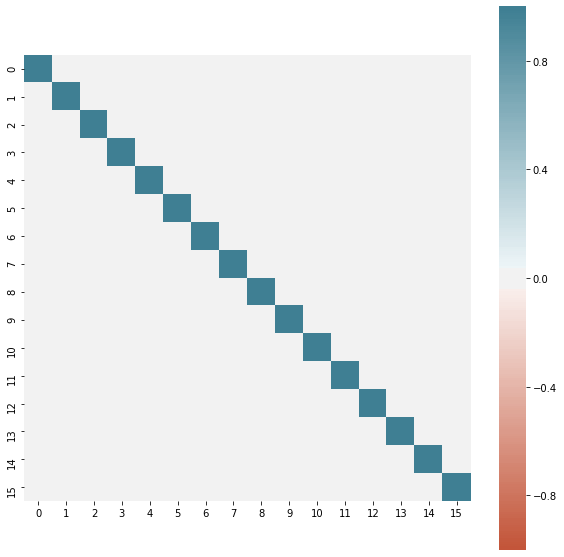

promedio corr 2.9456464930738256e-17
promedio corr abs 1.0836684123482228e-16


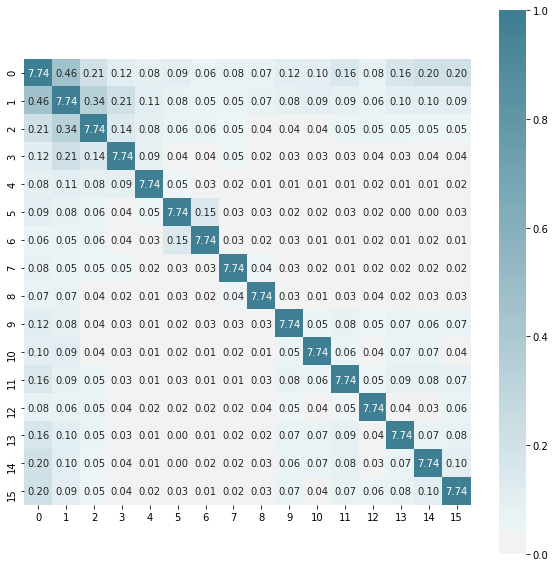

promedio MI 0.06095015767961341


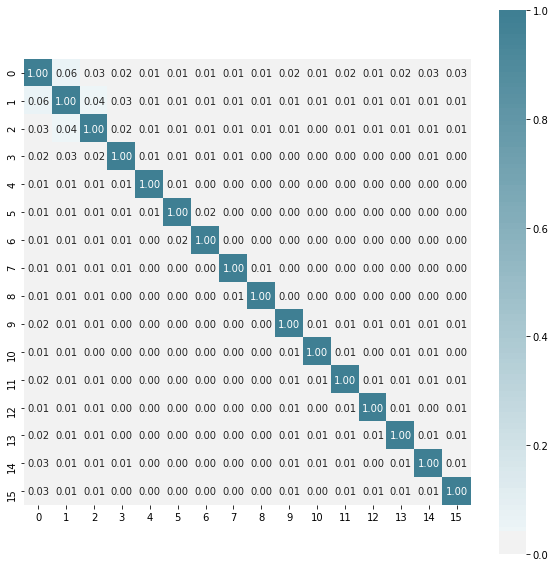

promedio Norm-MI 0.007876991649113813


In [11]:
x_all_fold = np.load("../obj4/LC_features/FourierPCA_300T_32D.npy")
x_all_fold = x_all_fold[:,:16]

aux = pd.DataFrame(x_all_fold)
corr = aux.corr()
plt.figure(figsize=(10,10))
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
plt.show()

a = corr.values
np.fill_diagonal(a, np.nan)

print("promedio corr",np.nanmean( a))
print("promedio corr abs",np.nanmean( np.abs(a)))

mut_inf = MI_between(x_all_fold, x_all_fold)

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    mut_inf, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, fmt=".2f",
)
plt.show()

a = mut_inf.copy()
np.fill_diagonal(a, np.nan)

print("promedio MI",np.nanmean( a))

Nmut_inf = NMI_between(x_all_fold, x_all_fold, version=1)

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    Nmut_inf, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, fmt=".2f",
)
plt.show()

a = Nmut_inf.copy()
np.fill_diagonal(a, np.nan)

print("promedio Norm-MI",np.nanmean( a))

#### FOURIER + ICA

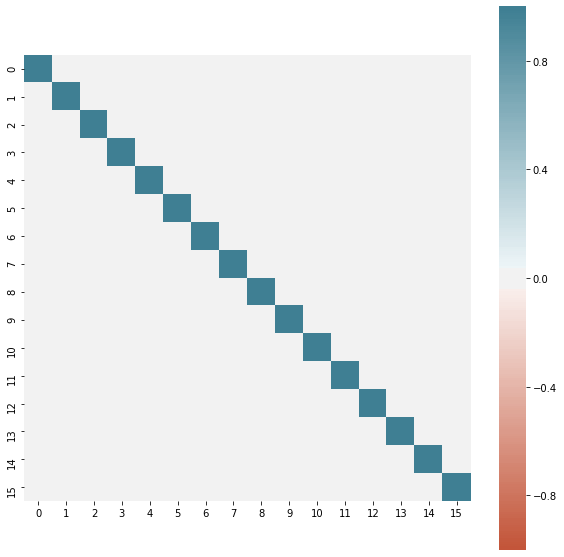

promedio corr -1.305111267981944e-16
promedio corr abs 3.4814532936975394e-15


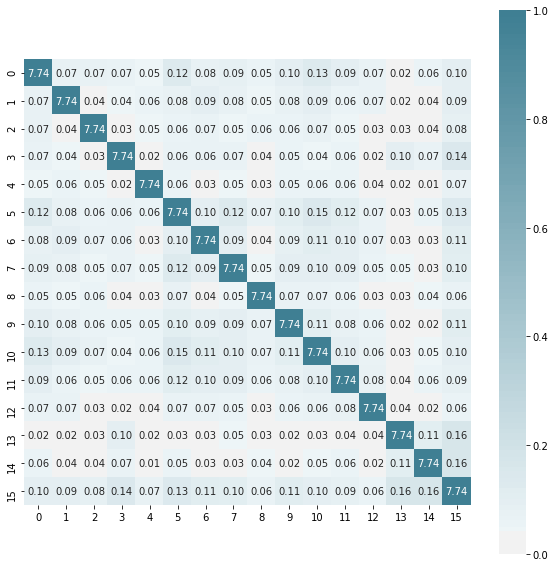

promedio MI 0.06726506455503044


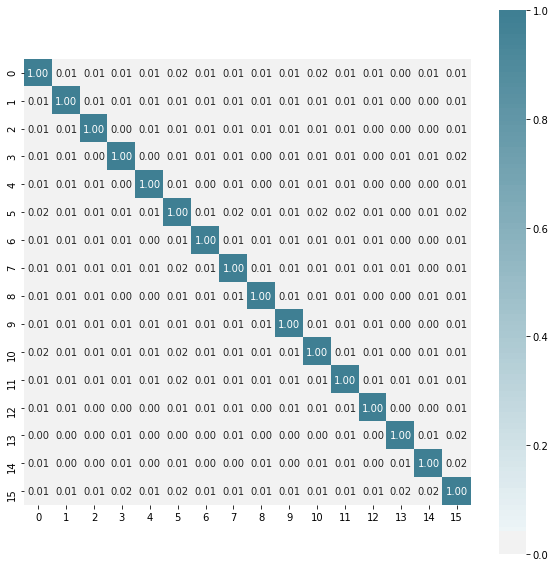

promedio Norm-MI 0.008693108899085913


In [10]:
x_all_fold = np.load("../obj4/LC_features/FourierICA_300T_32D.npy")
x_all_fold = x_all_fold[:,:16]

aux = pd.DataFrame(x_all_fold)
corr = aux.corr()
plt.figure(figsize=(10,10))
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
plt.show()

a = corr.values
np.fill_diagonal(a, np.nan)

print("promedio corr",np.nanmean( a))
print("promedio corr abs",np.nanmean( np.abs(a)))

mut_inf = MI_between(x_all_fold, x_all_fold)

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    mut_inf, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, fmt=".2f",
)
plt.show()

a = mut_inf.copy()
np.fill_diagonal(a, np.nan)

print("promedio MI",np.nanmean( a))

Nmut_inf = NMI_between(x_all_fold, x_all_fold, version=1)

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    Nmut_inf, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, fmt=".2f",
)
plt.show()

a = Nmut_inf.copy()
np.fill_diagonal(a, np.nan)

print("promedio Norm-MI",np.nanmean( a))

### SOM

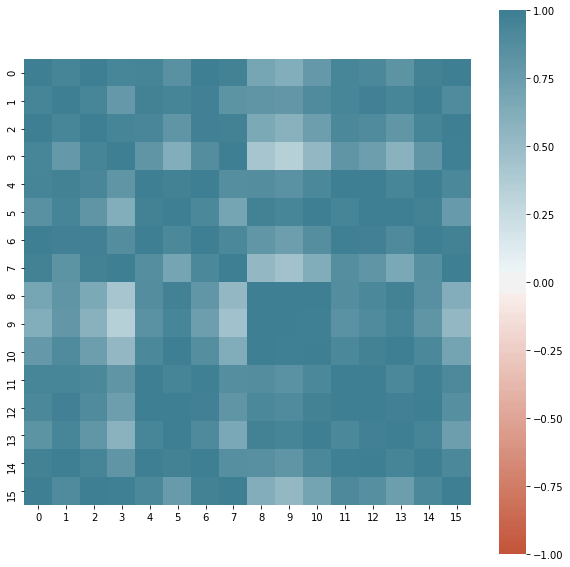

promedio corr 0.8672227910305497
promedio corr abs 0.8672227910305497


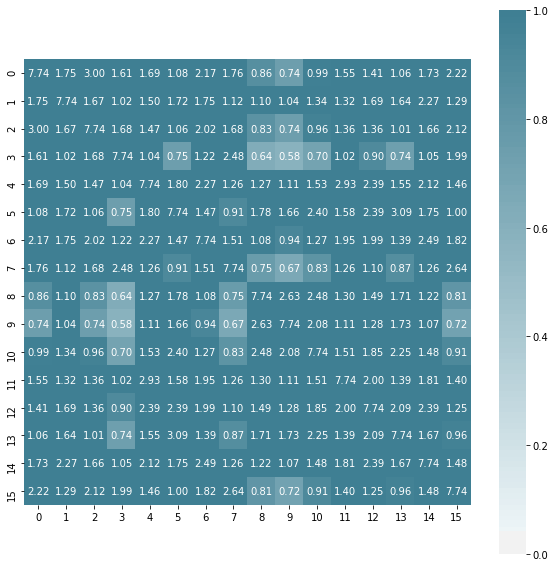

promedio MI 1.506537278811688


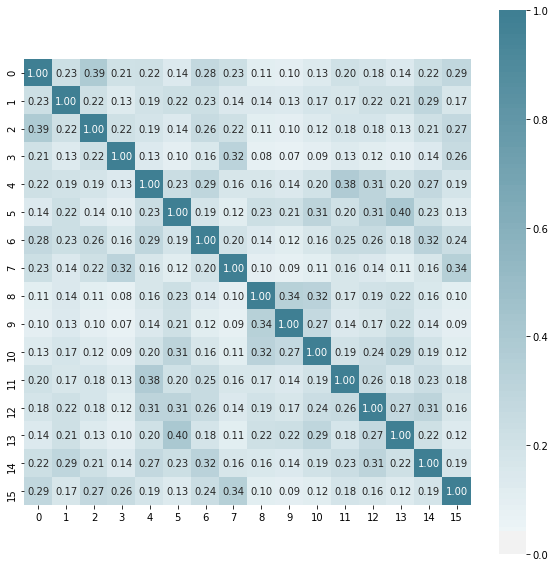

promedio Norm-MI 0.194699798255722


In [11]:
x_all = np.load("../obj4/LC_features/SOM_300T_16D.npy")
aux = pd.DataFrame(x_all)
corr = aux.corr()
plt.figure(figsize=(10,10))
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True)
plt.show()

a = corr.values
np.fill_diagonal(a, np.nan)
print("promedio corr",np.nanmean( a))
print("promedio corr abs",np.nanmean( np.abs(a)))

mut_inf = MI_between(x_all, x_all)

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    mut_inf, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, fmt=".2f")
plt.show()

a = mut_inf.copy()
np.fill_diagonal(a, np.nan)
print("promedio MI",np.nanmean( a))

Nmut_inf = NMI_between(x_all, x_all, version=1)

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    Nmut_inf, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, fmt=".2f")
plt.show()

a = Nmut_inf.copy()
np.fill_diagonal(a, np.nan)
print("promedio Norm-MI",np.nanmean( a))

### LLP

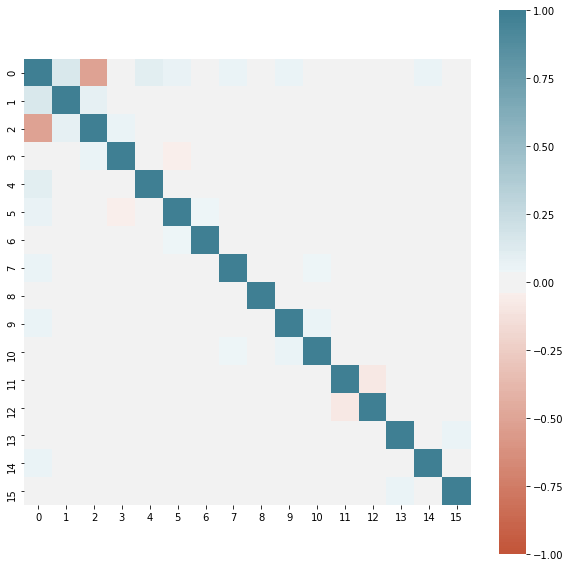

promedio corr 0.0016264664018019797
promedio corr abs 0.023192367798652393


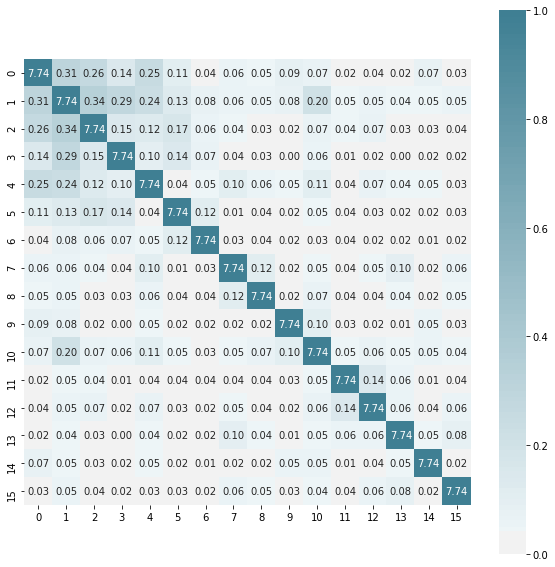

promedio MI 0.0639590702657247


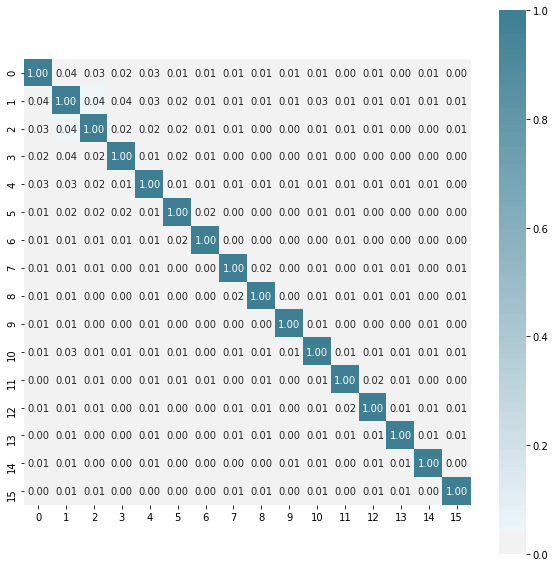

promedio Norm-MI 0.008265855400104145


In [9]:
x_all = np.load("../obj4/LC_features/LLP_300T_16D.npy")
aux = pd.DataFrame(x_all)
corr = aux.corr()
plt.figure(figsize=(10,10))
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True)
plt.show()

a = corr.values
np.fill_diagonal(a, np.nan)
print("promedio corr",np.nanmean( a))
print("promedio corr abs",np.nanmean( np.abs(a)))

mut_inf = MI_between(x_all, x_all)

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    mut_inf, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, fmt=".2f")
plt.show()

a = mut_inf.copy()
np.fill_diagonal(a, np.nan)
print("promedio MI",np.nanmean( a))

Nmut_inf = NMI_between(x_all, x_all, version=1)

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    Nmut_inf, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, fmt=".2f")
plt.show()

a = Nmut_inf.copy()
np.fill_diagonal(a, np.nan)
print("promedio Norm-MI",np.nanmean( a))

### Autoencoder

data shape= (8054, 16)


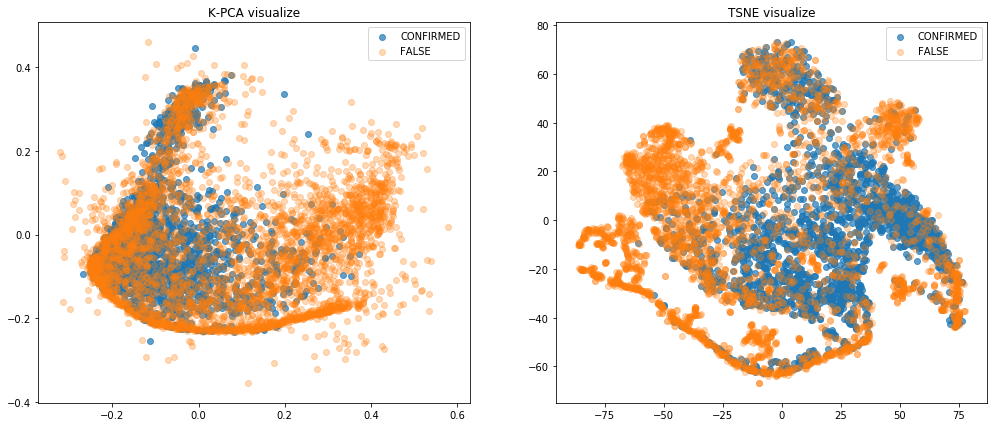

In [13]:
x_all = np.load("./LC_features/AE_%dT_%dD.npy"%(T,latent_dim))
print("data shape=",x_all.shape)
aux = pd.DataFrame(x_all)

to_plot_kpca, to_plot_tsne = visualize_dims(x_all, all_labels)

In [133]:
cluster_meas(x_all, tipo="AE")

Cluster encontrados = 3
>> Con DBSCAN 
Silhouette (-1,1) + mejor =  0.63351935
davies_bouldin (0, infty) -mejor =  0.5048407655013734
>> Con Birch K=2 
Silhouette (-1,1) + mejor =  0.42105982
davies_bouldin (0, infty) -mejor =  1.4830843982591926
>> Con Birch K=3 
Silhouette (-1,1) + mejor =  0.2873754
davies_bouldin (0, infty) -mejor =  1.399456578939466


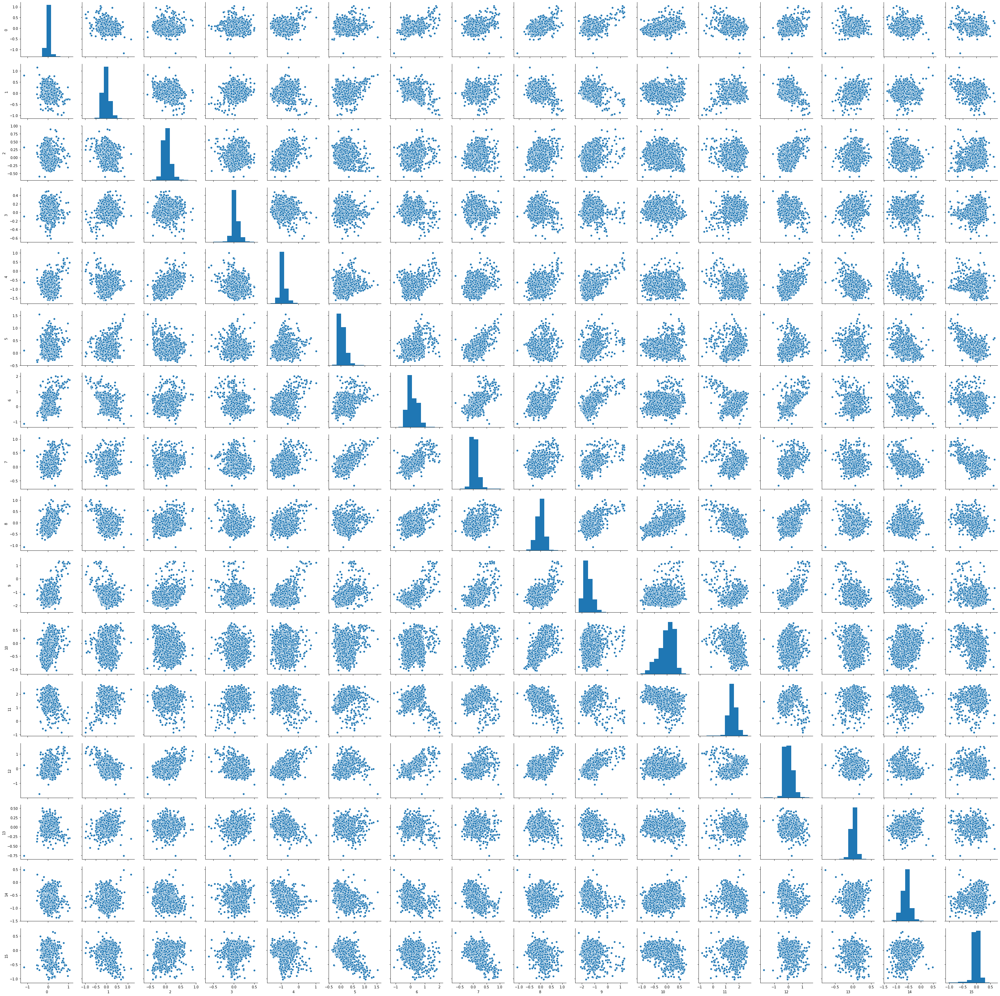

In [146]:
sns.pairplot(aux)
plt.show()

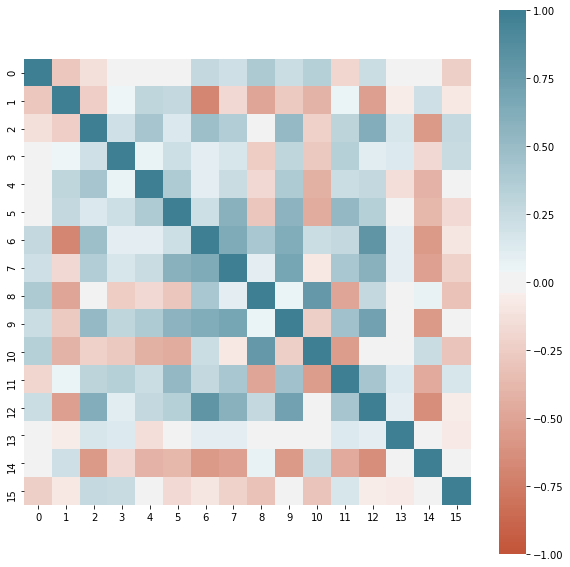

promedio corr 0.057848440572146206
promedio corr abs 0.27713817808233043


In [27]:
corr = aux.corr()

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
plt.show()

a = corr.values
np.fill_diagonal(a, np.nan)

print("promedio corr",np.nanmean( a))
print("promedio corr abs",np.nanmean( np.abs(a)))

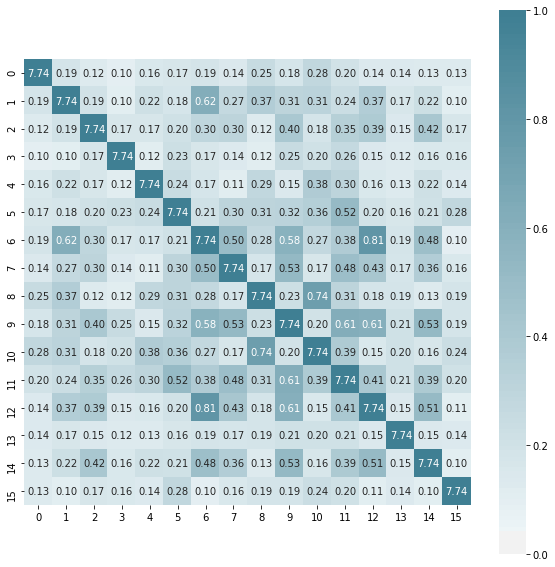

promedio MI 0.25495492799100405


In [28]:
mut_inf = MI_between(x_all, x_all)

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    mut_inf, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, fmt=".2f",
)
plt.show()

a = mut_inf.copy()
np.fill_diagonal(a, np.nan)

print("promedio MI",np.nanmean( a))

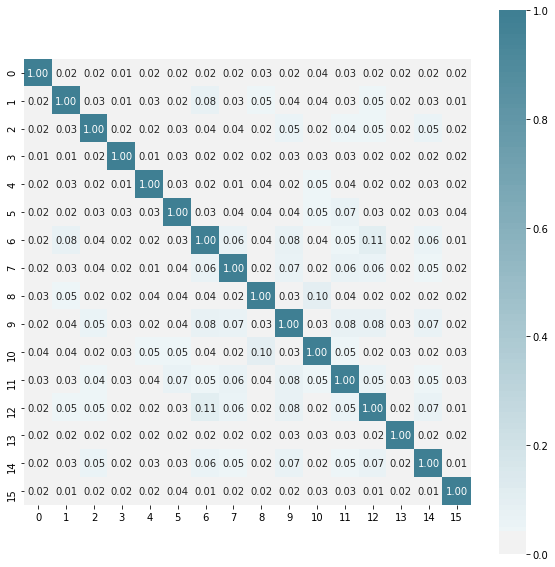

promedio Norm-MI 0.032949143092267805


In [29]:
Nmut_inf = NMI_between(x_all, x_all, version=1)

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    Nmut_inf, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, fmt=".2f",
)
plt.show()

a = Nmut_inf.copy()
np.fill_diagonal(a, np.nan)

print("promedio Norm-MI",np.nanmean( a))

### Variational Autoencoder
> features son mas independientes entre si, se atribuye al VAE.. incluso más ind que la Metadata

data shape= (8054, 16)


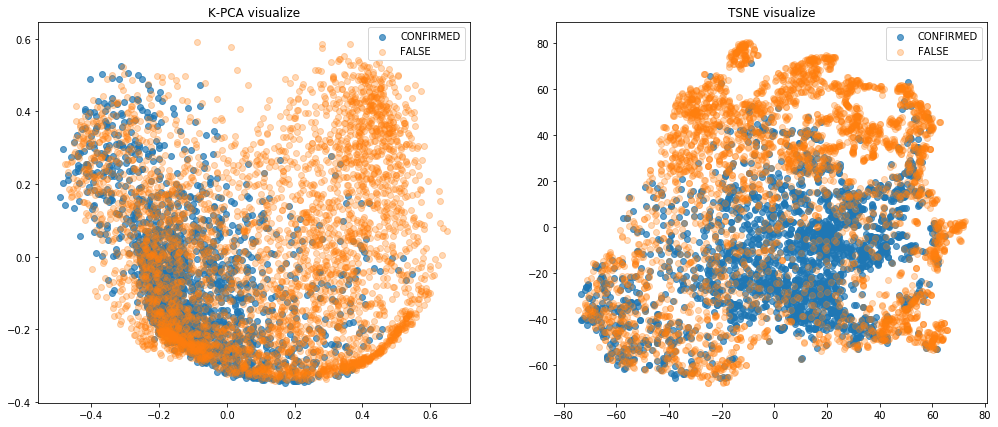

In [17]:
x_all = np.load("./LC_features/VAE_%dT_%dD.npy"%(T,latent_dim))
print("data shape=",x_all.shape)
aux = pd.DataFrame(x_all)

to_plot_kpca, to_plot_tsne = visualize_dims(x_all, all_labels)

In [58]:
cluster_meas(x_all, tipo="VAE")

Cluster encontrados = 4
>> Con DBSCAN 
Silhouette (-1,1) + mejor =  0.14601232
davies_bouldin (0, infty) -mejor =  1.2992278562062558
>> Con Birch K=2 
Silhouette (-1,1) + mejor =  0.11284825
davies_bouldin (0, infty) -mejor =  2.805905891265451
>> Con Birch K=3 
Silhouette (-1,1) + mejor =  0.1068844
davies_bouldin (0, infty) -mejor =  2.683819780228935


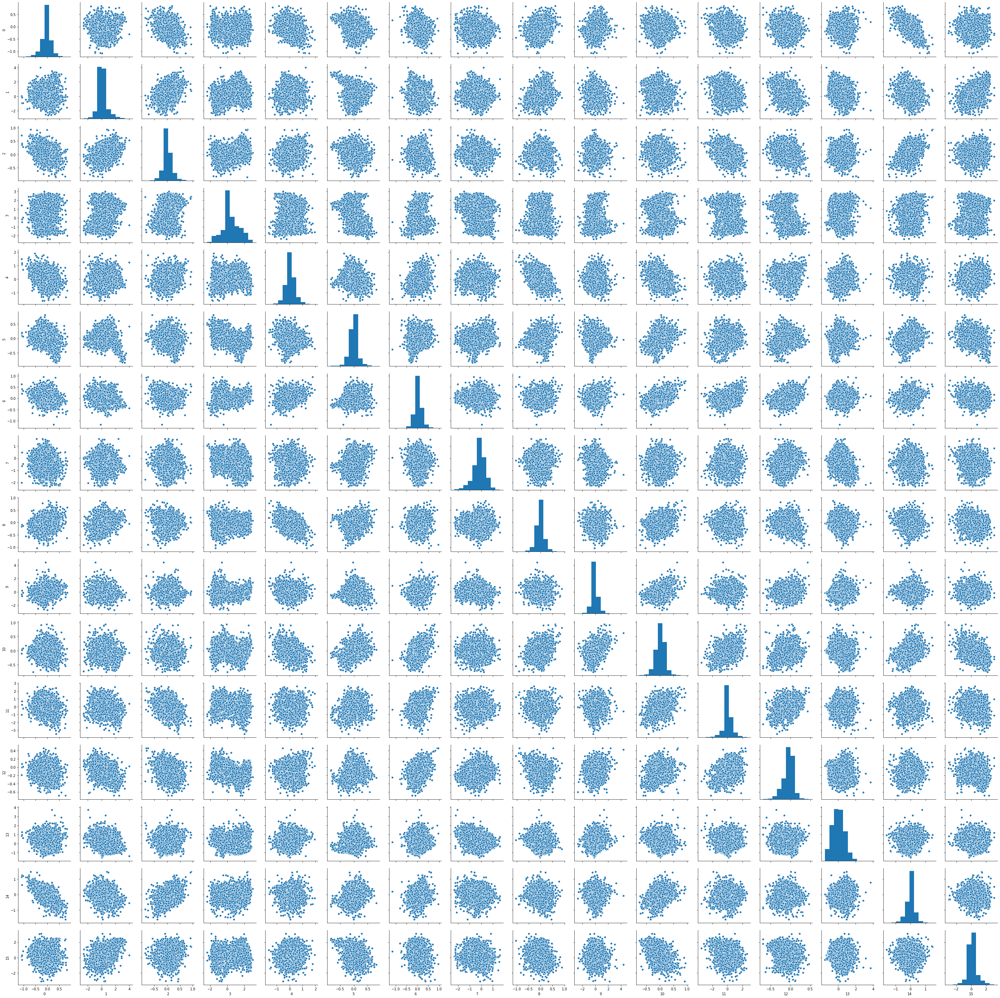

In [59]:
sns.pairplot(aux)
plt.show()

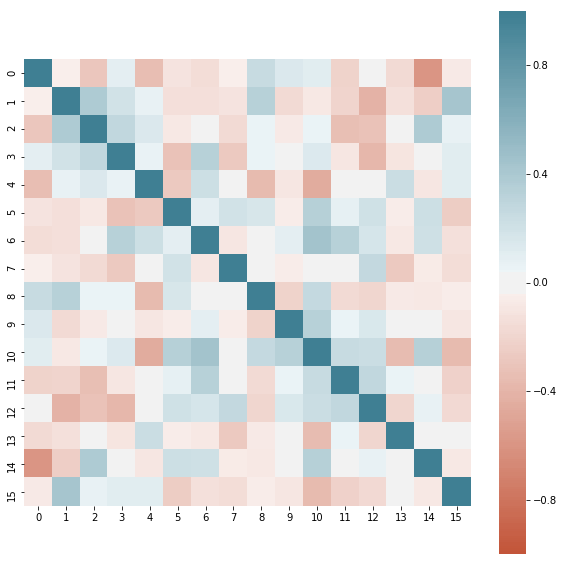

promedio corr -0.011636259311738282
promedio corr abs 0.16769347105531018


In [41]:
corr = aux.corr()

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
plt.show()

a = corr.values
np.fill_diagonal(a, np.nan)

print("promedio corr",np.nanmean( a))
print("promedio corr abs",np.nanmean( np.abs(a)))

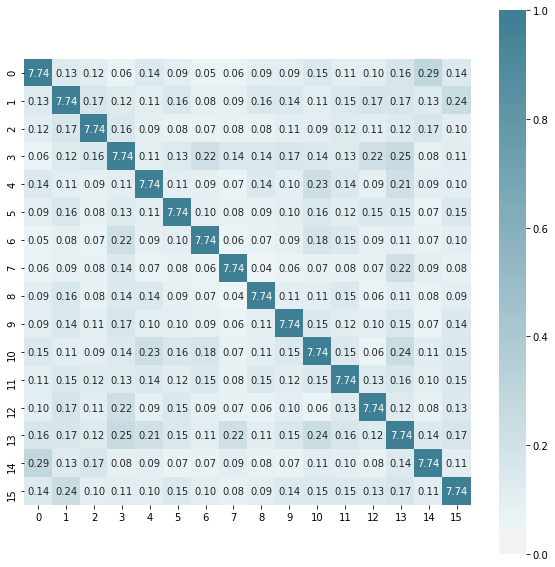

promedio MI 0.12186015576569469


In [18]:
mut_inf = MI_between(x_all, x_all)

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    mut_inf, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, fmt=".2f",
)
plt.show()

a = mut_inf.copy()
np.fill_diagonal(a, np.nan)

print("promedio MI",np.nanmean( a))

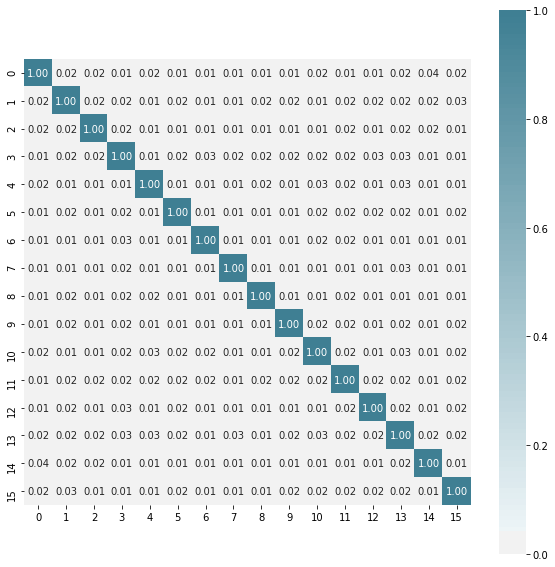

promedio Norm-MI 0.01574876230145772


In [19]:
Nmut_inf = NMI_between(x_all, x_all, version=1)

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    Nmut_inf, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, fmt=".2f",
)
plt.show()

a = Nmut_inf.copy()
np.fill_diagonal(a, np.nan)

print("promedio Norm-MI",np.nanmean( a))

### VAE + escala

data shape= (8054, 16)


/opt/ohpc/pub/moduledeps/anaconda3/lib/python3.7/site-packages/sklearn/utils/extmath.py:530: RuntimeWarning: invalid value encountered in multiply
  v *= signs[:, np.newaxis]


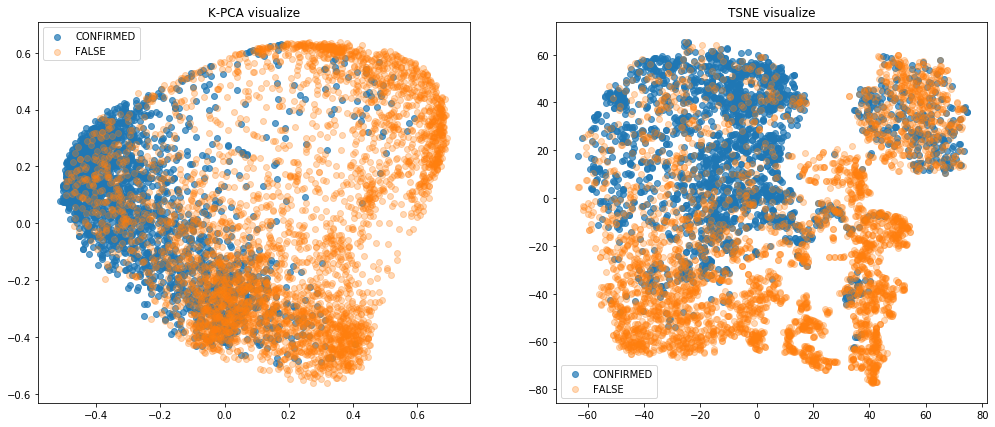

In [4]:
x_all = np.load("./LC_features/VAE_S_%dT_%dD.npy"%(T,latent_dim))
print("data shape=",x_all.shape)
aux = pd.DataFrame(x_all)

to_plot_kpca, to_plot_tsne = visualize_dims(x_all, all_labels)

In [105]:
cluster_meas(x_all, tipo="VAEs")

Cluster encontrados = 3
>> Con DBSCAN 
Silhouette (-1,1) + mejor =  0.21313497
davies_bouldin (0, infty) -mejor =  1.094107680844383
>> Con Birch K=2 
Silhouette (-1,1) + mejor =  0.3074209
davies_bouldin (0, infty) -mejor =  2.226811102718263
>> Con Birch K=3 
Silhouette (-1,1) + mejor =  0.20320903
davies_bouldin (0, infty) -mejor =  2.0986957194619076


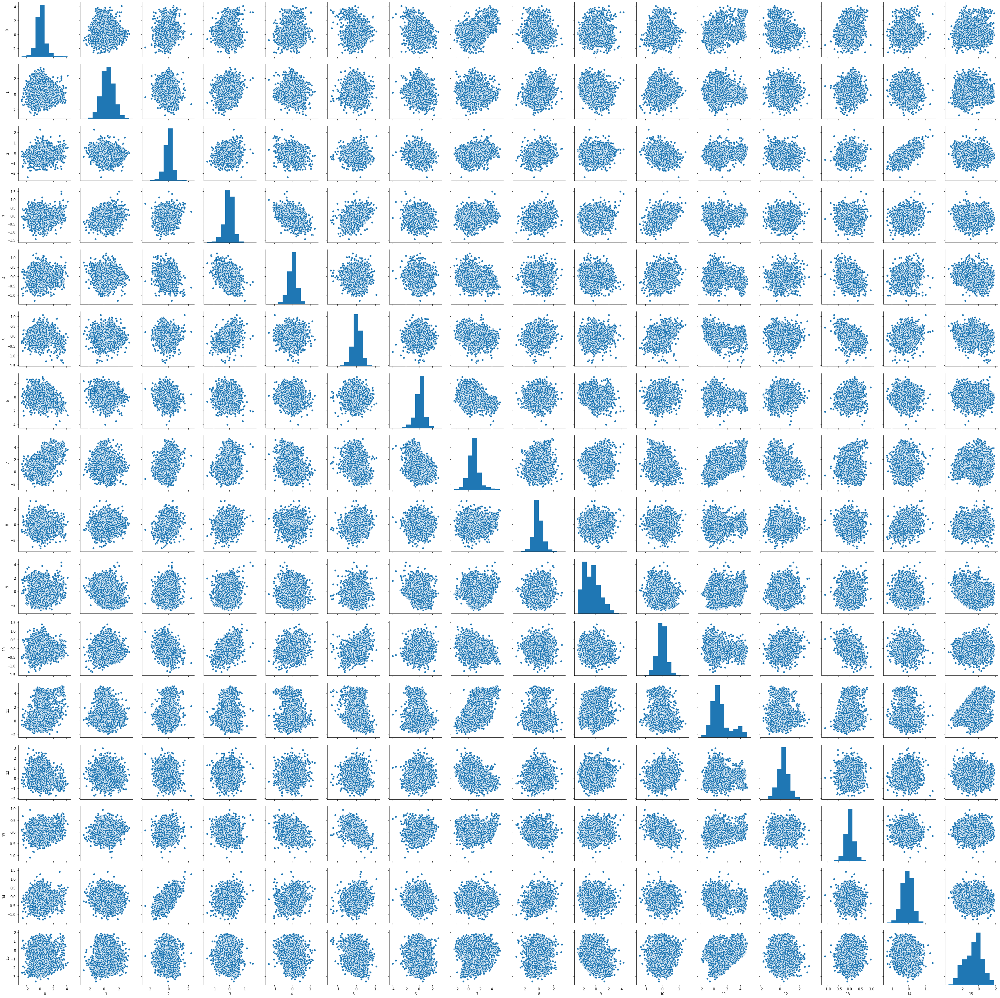

In [140]:
sns.pairplot(aux)
plt.show()

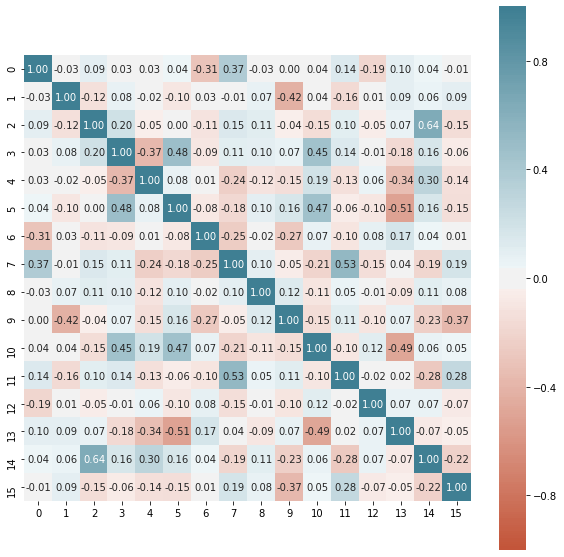

promedio corr -0.0030107335416747582
promedio corr abs 0.13810234395523585


In [9]:
corr = aux.corr()

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, fmt=".2f",
)
plt.show()

a = corr.values
np.fill_diagonal(a, np.nan)

print("promedio corr",np.nanmean( a))
print("promedio corr abs",np.nanmean( np.abs(a)))

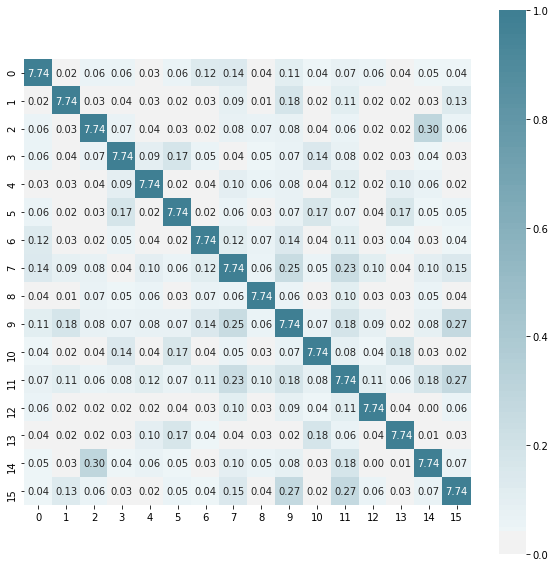

promedio MI 0.07179327851978254


In [6]:
mut_inf = MI_between(x_all, x_all)

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    mut_inf, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, fmt=".2f",
)
plt.show()

a = mut_inf.copy()
np.fill_diagonal(a, np.nan)

print("promedio MI",np.nanmean( a))

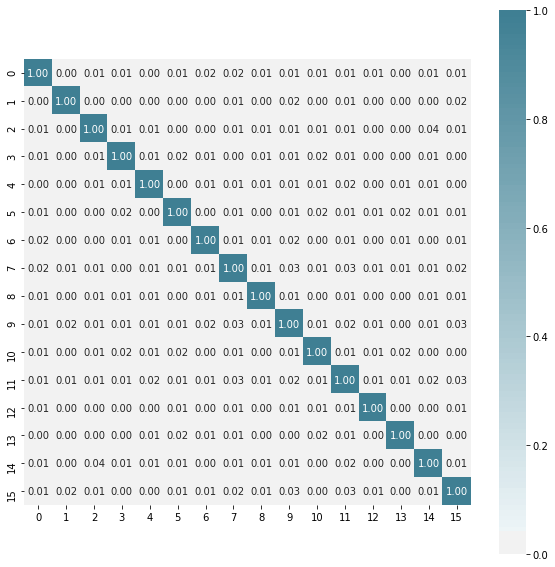

promedio Norm-MI 0.009278297406582354


In [7]:
Nmut_inf = NMI_between(x_all, x_all, version=1)

plt.figure(figsize=(10,10))
ax = sns.heatmap(
    Nmut_inf, 
    vmin=0, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True,
    annot=True, fmt=".2f",
)
plt.show()

a = Nmut_inf.copy()
np.fill_diagonal(a, np.nan)

print("promedio Norm-MI",np.nanmean( a))

### clustering

In [28]:
from sklearn.metrics import silhouette_score, davies_bouldin_score

def evaluate_clus(X,labels):
    s = silhouette_score(X, labels, metric='euclidean')
    d = davies_bouldin_score(X, labels)
    print("Silhouette (-1,1) + mejor = ",s)
    print("davies_bouldin (0, infty) -mejor = ",d)
    
def cluster_meas(X, tipo= "VAEs"):
    to_clu = StandardScaler().fit_transform(X[mask_C])
    
    if tipo=="VAEs":
        eps_v = 1.2
    elif tipo=="AE":
        eps_v = 0.4
    elif tipo =="meta":
        eps_v = 0.45
    elif tipo=="VAE":
        eps_v = 0.8

    elif tipo=="PCA":
        eps_v = 0.95
        
    model = DBSCAN(eps=eps_v, min_samples=10, metric='euclidean', n_jobs=-1)
    model.fit(to_clu)
    clus_l = model.labels_
    K = clus_l.max()+1
    print("Cluster encontrados =",K)
    print(">> Con DBSCAN ")
    evaluate_clus(to_clu[clus_l!=-1], clus_l[clus_l!=-1])
    
    model = Birch(threshold=0.5, n_clusters=2)
    model.fit(to_clu)
    print(">> Con Birch K=2 ")
    evaluate_clus(to_clu, model.labels_)

    
    model = Birch(threshold=0.5, n_clusters=3)
    model.fit(to_clu)
    print(">> Con Birch K=3 ")
    evaluate_clus(to_clu, model.labels_)
    
    
mask_C = df_meta["NExScI Disposition"].values ==  "CONFIRMED"

In [13]:
#to_clu = StandardScaler().fit_transform(x_all)
to_clu = StandardScaler().fit_transform(new_x_all[mask_C])

In [25]:
#model = KMeans(n_clusters=2, n_jobs=-1)
#model = SpectralClustering(n_clusters=2, n_jobs=-1)
#model = DBSCAN(eps=0.15, min_samples=10, metric='cosine', n_jobs=-1)


model = DBSCAN(eps=0.95, min_samples=10, metric='euclidean', n_jobs=-1)

#model = Birch(threshold=0.5, n_clusters=2)

In [26]:
model.fit(to_clu)
clus_l = model.labels_
K = clus_l.max()+1

print("Cluster encontrados =",K)
clus_l

Cluster encontrados = 4


array([ 0, -1, -1, ..., -1, -1, -1])

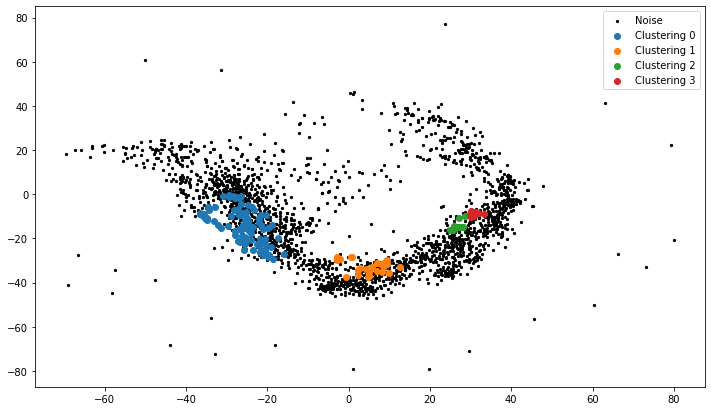

In [27]:
plt.figure(figsize=(12,7))
mask_ = (clus_l==-1)
plt.scatter(to_plot_tsne[mask_C,0][mask_],to_plot_tsne[mask_C,1][mask_], label="Noise", s=5, c='black')

for i in range(K):
    mask_ = (clus_l==i)
    plt.scatter(to_plot_tsne[mask_C,0][mask_],to_plot_tsne[mask_C,1][mask_], label="Clustering "+str(i))
plt.legend()
plt.show() ## euclidean

In [91]:
mask_ = df_meta["NExScI Disposition"].values ==  "FALSE POSITIVE"
#mask_ = df_meta["NExScI Disposition"].values ==  "CONFIRMED"

aux = StandardScaler().fit_transform(x_all[mask_])

Ks = []
for e in np.arange(0.1,3, 0.1):
    model = DBSCAN(eps=e, min_samples=5, metric='euclidean', n_jobs=-1)

    clus_l = model.fit(aux).labels_
    K = clus_l.max()+1
    Ks.append(K)

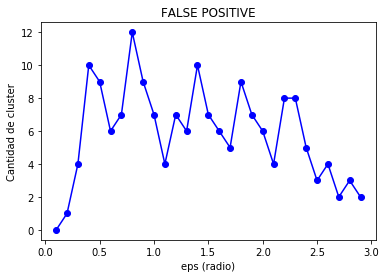

In [90]:
plt.plot(np.arange(0.1,3, 0.1),Ks , 'bo-')
plt.ylabel("Cantidad de cluster")
plt.xlabel("eps (radio)")
plt.title("FALSE POSITIVE")
plt.show()

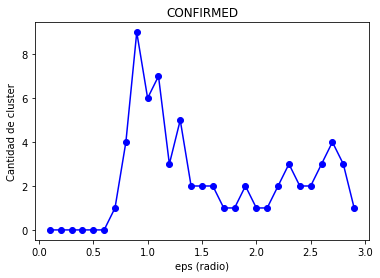

In [92]:
plt.plot(np.arange(0.1,3, 0.1),Ks, 'bo-')
plt.ylabel("Cantidad de cluster")
plt.xlabel("eps (radio)")
plt.title("CONFIRMED")
plt.show()

### COnfirmeds

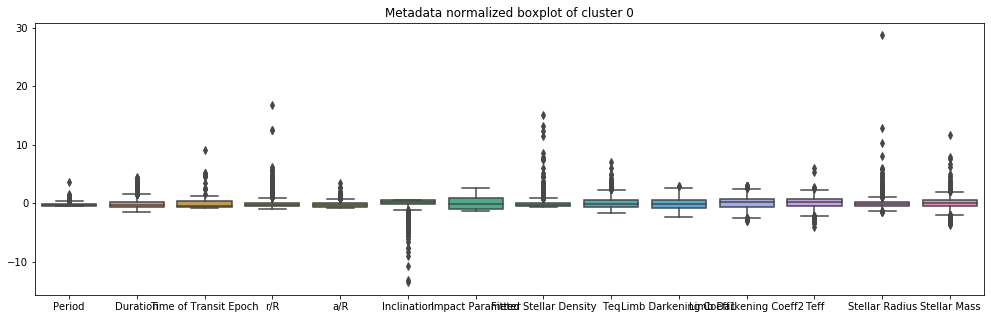

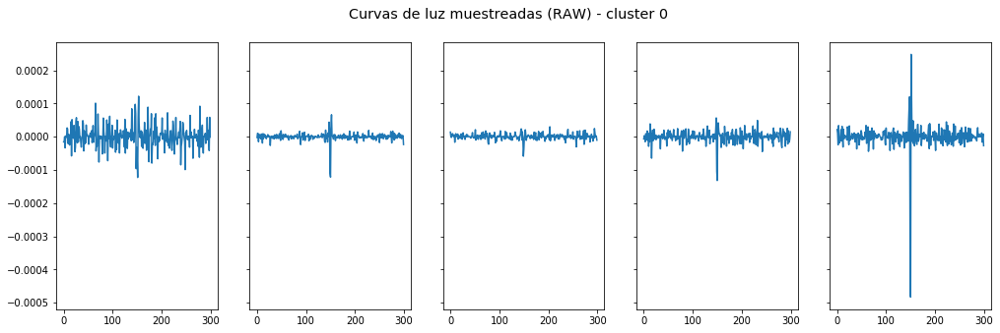

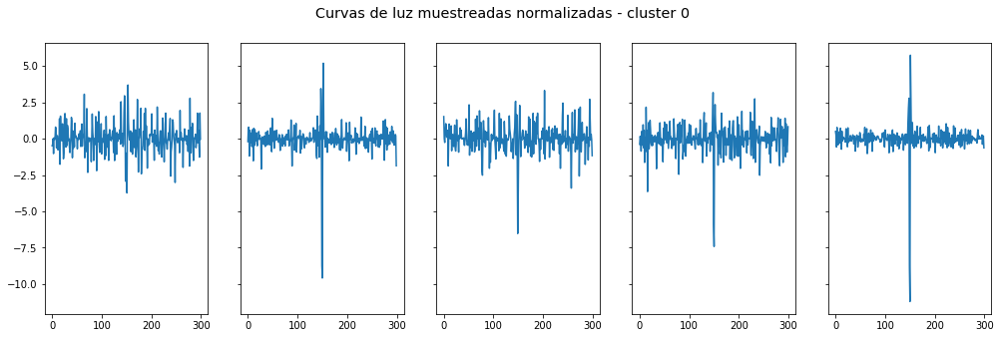

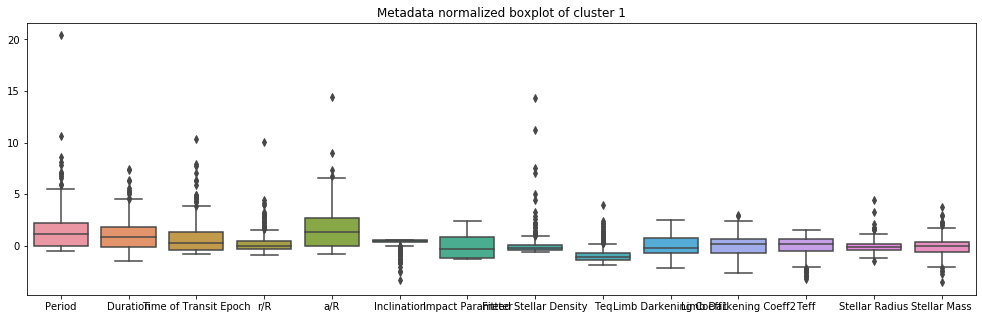

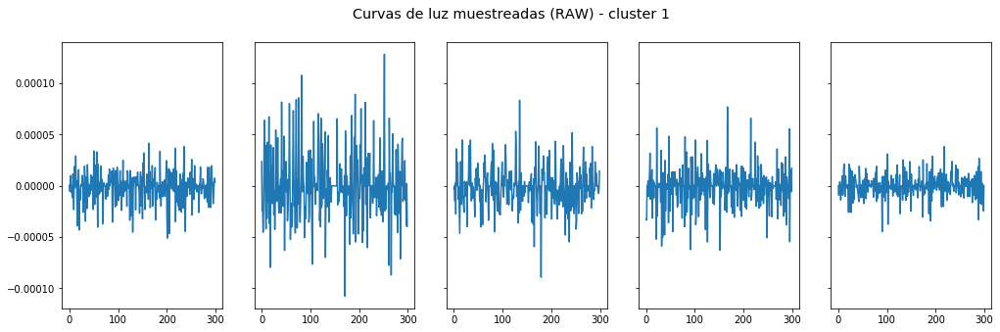

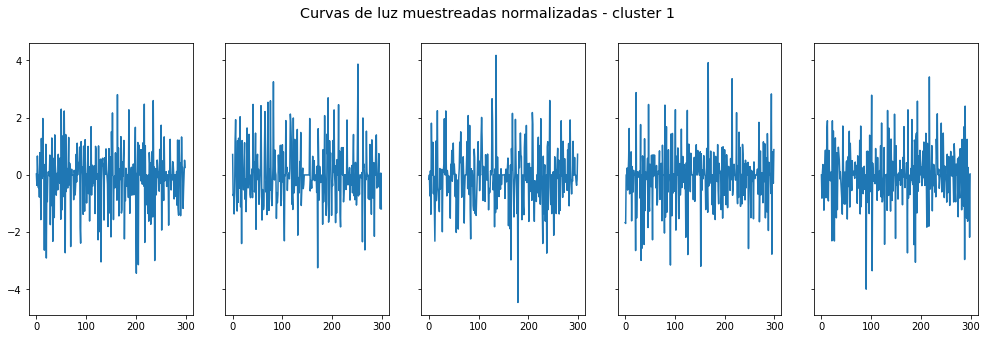

In [67]:
df_clus_i = visualize_clusters_conf(clus_l) ## Birch K =2

In [68]:
df_clus_i

,#data,Period,Duration,Time of Transit Epoch,r/R,a/R,Inclination,Impact Parameter,Fitted Stellar Density,Teq,Limb Darkening Coeff1,Limb Darkening Coeff2,Teff,Stellar Radius,Stellar Mass
0,2001,15.458568,0.162303,152.320675,0.024902,22.925591,87.786367,0.430993,2.292273,884.603198,0.435818,0.242357,5483.371814,1.070686,0.938244
1,280,105.978866,0.300032,190.934561,0.032204,87.127243,89.094750,0.392889,2.991308,523.428571,0.443800,0.237168,5441.067857,1.046639,0.919932


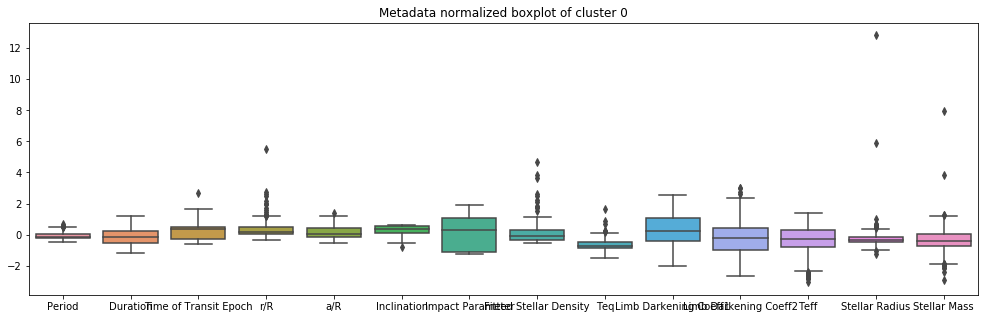

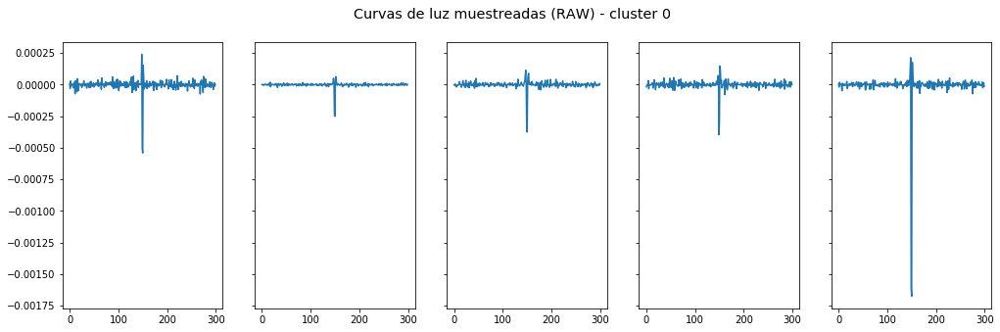

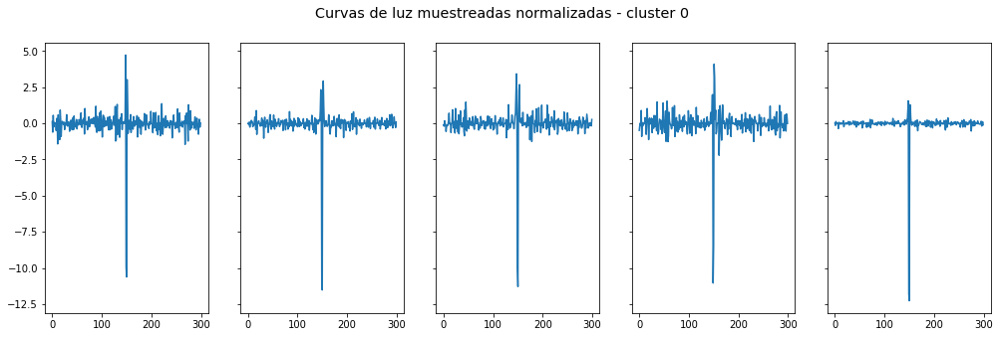

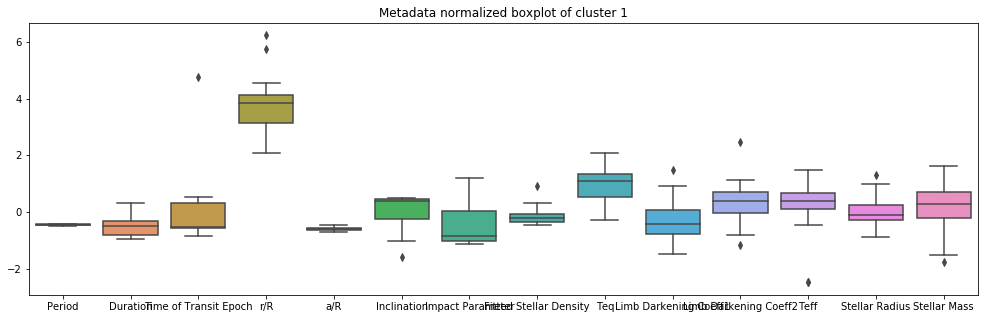

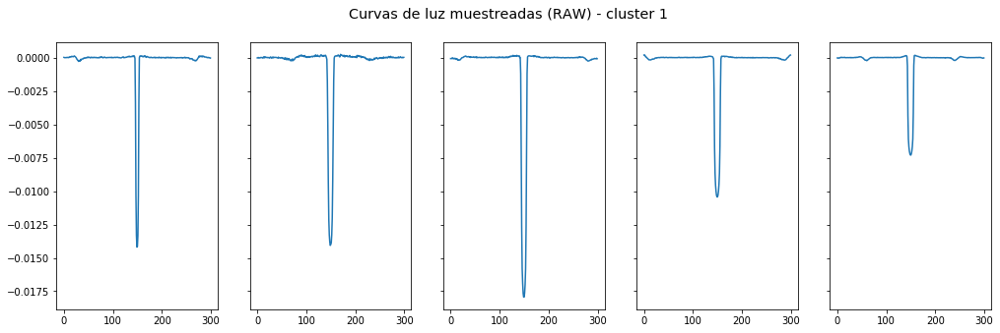

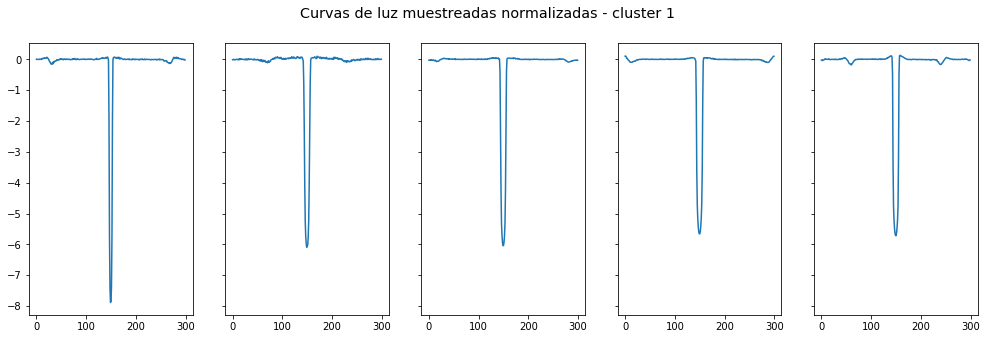

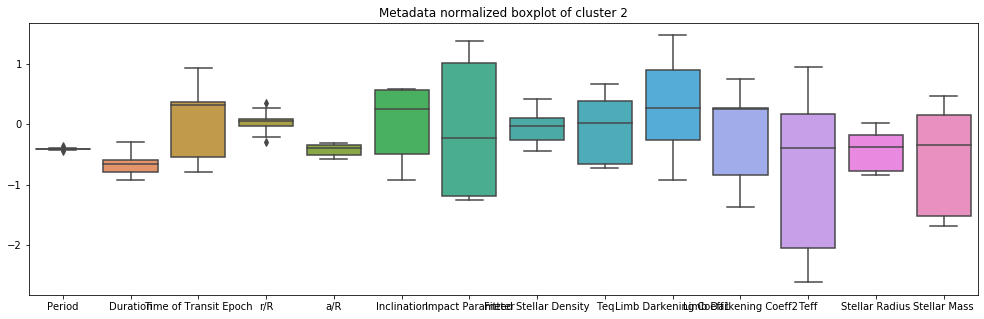

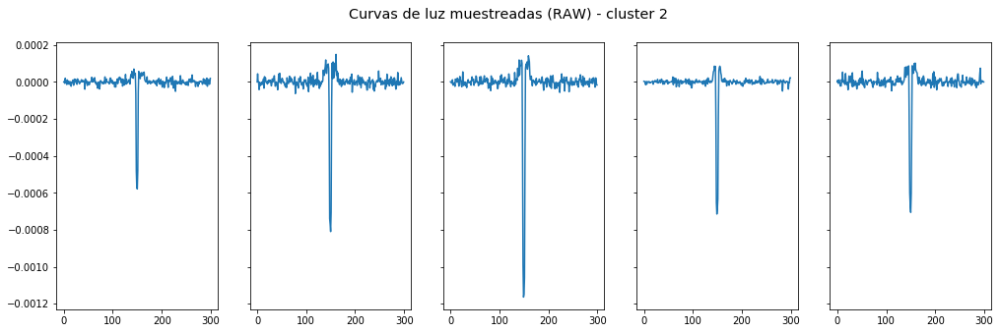

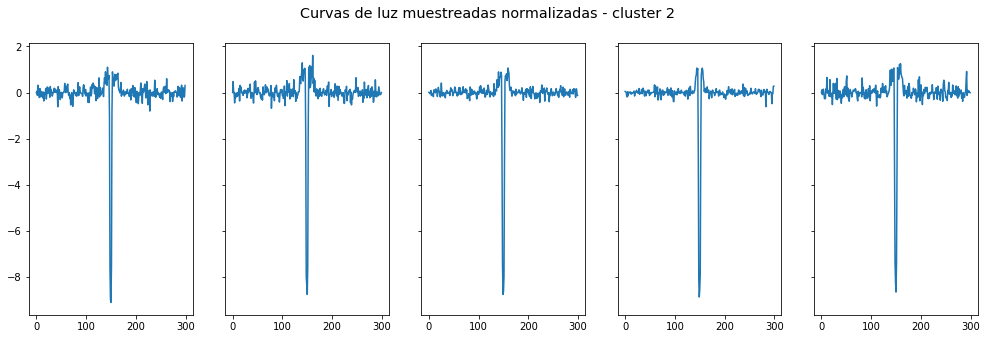

In [72]:
df_clus_i = visualize_clusters_conf(clus_l) #DBSCAN

In [73]:
df_clus_i

,#data,Period,Duration,Time of Transit Epoch,r/R,a/R,Inclination,Impact Parameter,Fitted Stellar Density,Teq,Limb Darkening Coeff1,Limb Darkening Coeff2,Teff,Stellar Radius,Stellar Mass
0,210,22.726325,0.166821,165.660961,0.033852,36.142976,89.000952,0.447638,2.871367,588.785714,0.468962,0.224929,5207.233333,0.920790,0.854486
1,21,3.342183,0.123406,156.125587,0.112952,9.215333,88.014286,0.287476,1.738184,1238.285714,0.404000,0.265333,5612.333333,1.063333,0.986429
2,13,5.708006,0.101856,155.900749,0.026462,15.296538,88.107692,0.407923,2.321770,831.153846,0.472692,0.227538,5038.076923,0.799923,0.812385


### All

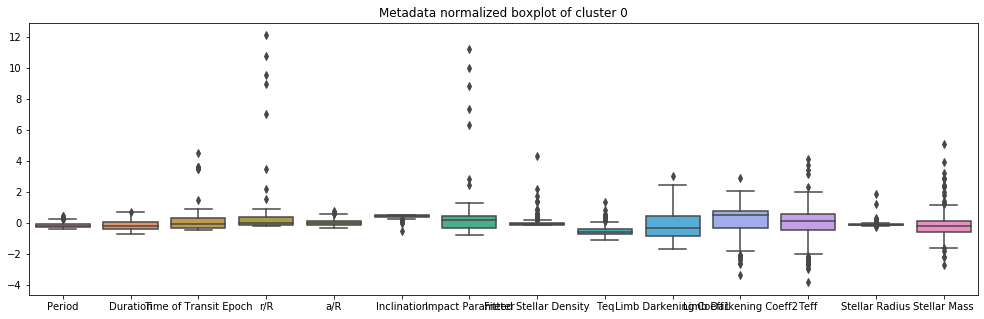

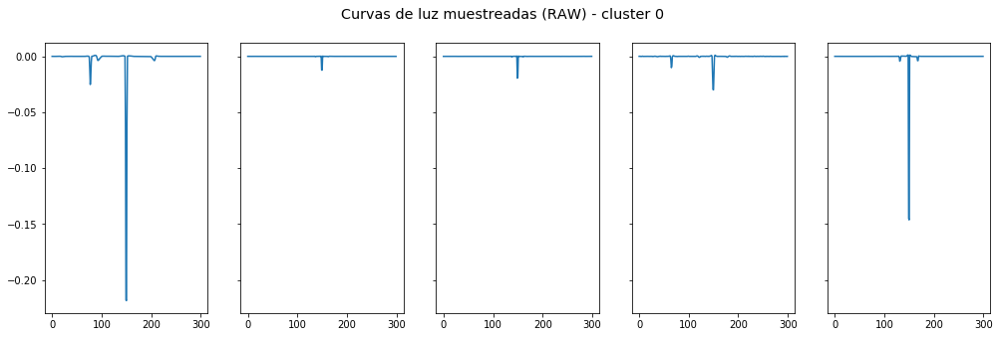

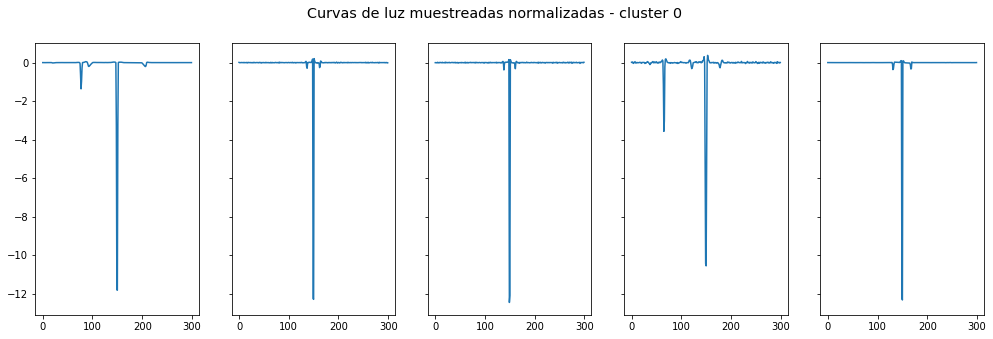

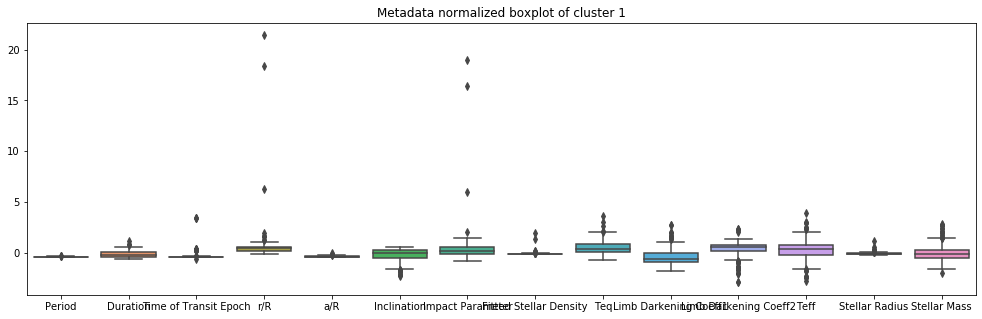

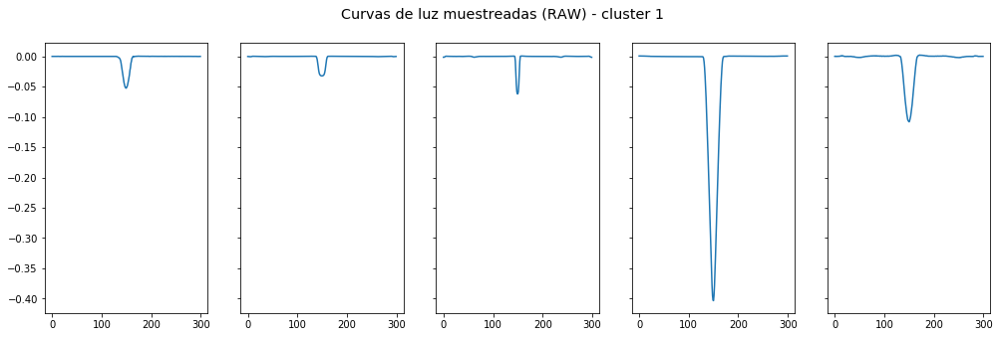

...

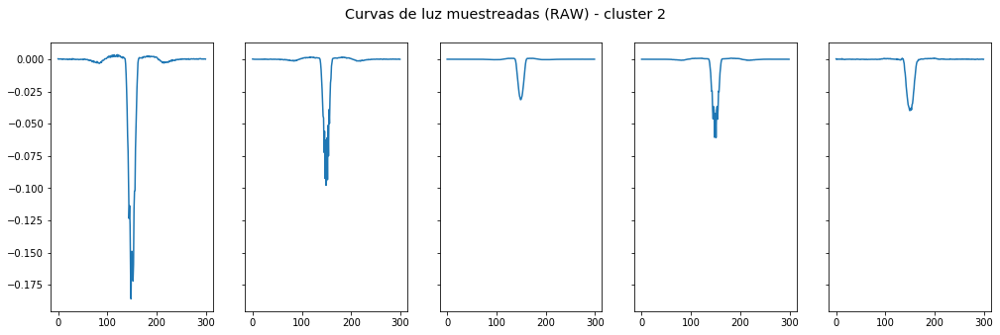

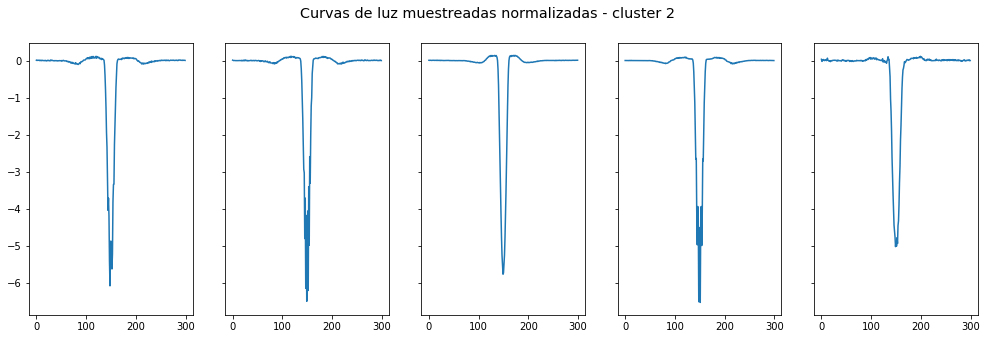

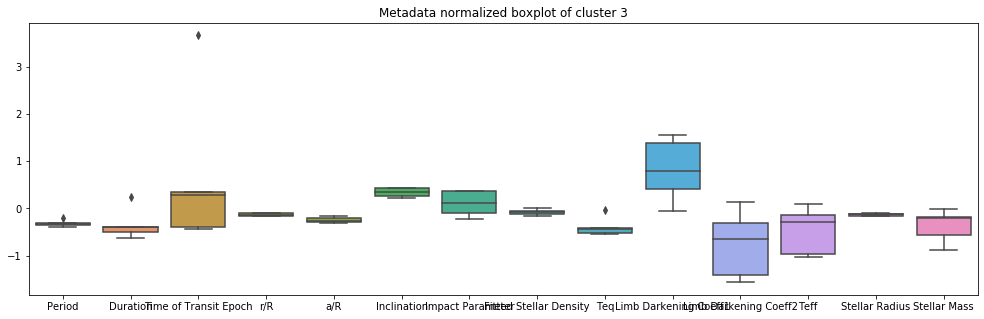

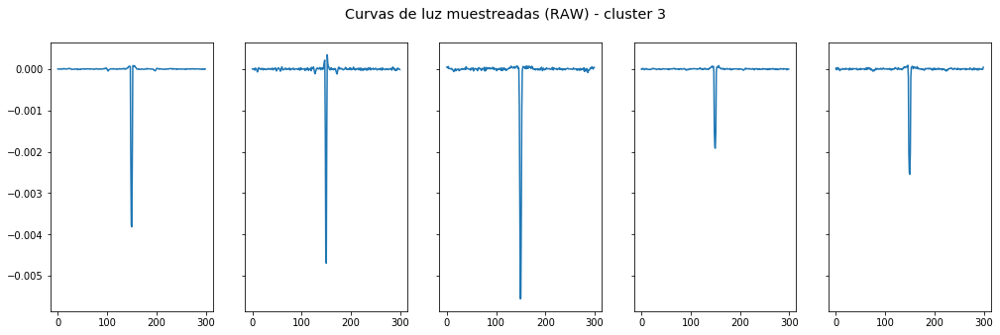

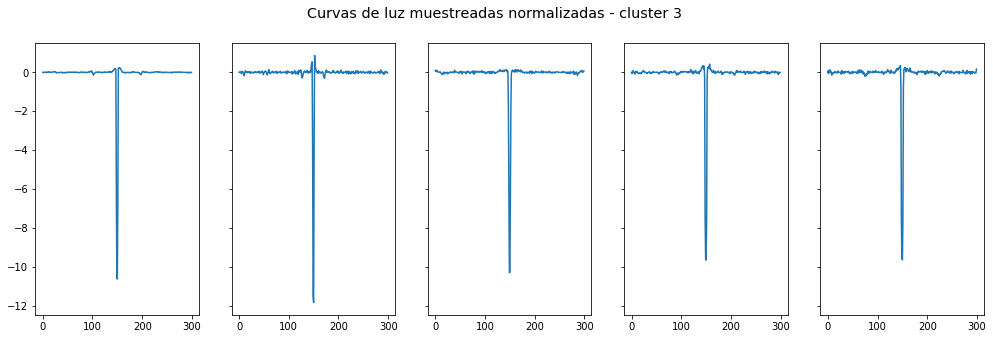

In [78]:
df_clus_i = visualize_clusters(clus_l) #DBSCAN

In [79]:
df_clus_i

,#data,CONF_ratio,CAND_ratio,Period,Duration,Time of Transit Epoch,r/R,a/R,Inclination,Impact Parameter,Fitted Stellar Density,Teq,Limb Darkening Coeff1,Limb Darkening Coeff2,Teff,Stellar Radius,Stellar Mass
0,354,0.344937,0.107345,23.582037,0.185344,162.912584,0.323028,37.691427,88.438192,0.781610,3.558782,701.064972,0.398684,0.261438,5674.206215,1.143398,0.962839
1,265,0.072874,0.067925,2.624701,0.178215,138.123260,0.541947,5.900404,78.679660,0.868513,1.095397,1581.600000,0.367249,0.276804,5905.328302,1.231287,1.000638
2,10,0.000000,0.100000,1.821916,0.161667,132.297079,0.428200,4.136700,76.546000,0.880900,0.425170,1726.000000,0.320100,0.296900,6289.800000,1.152500,1.068400
3,5,0.800000,0.000000,9.230792,0.134646,197.601016,0.064400,16.592600,87.214000,0.700200,2.090588,814.000000,0.496800,0.203400,5321.400000,0.871600,0.889400


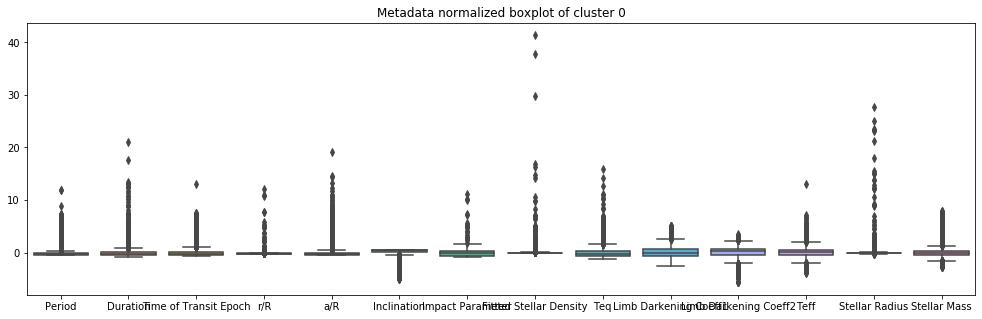

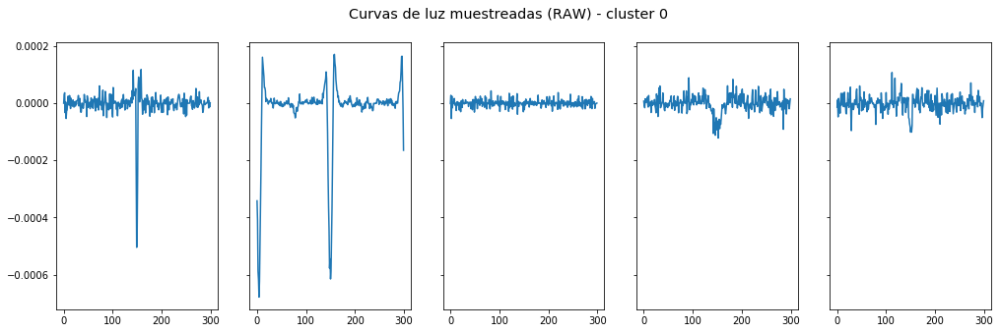

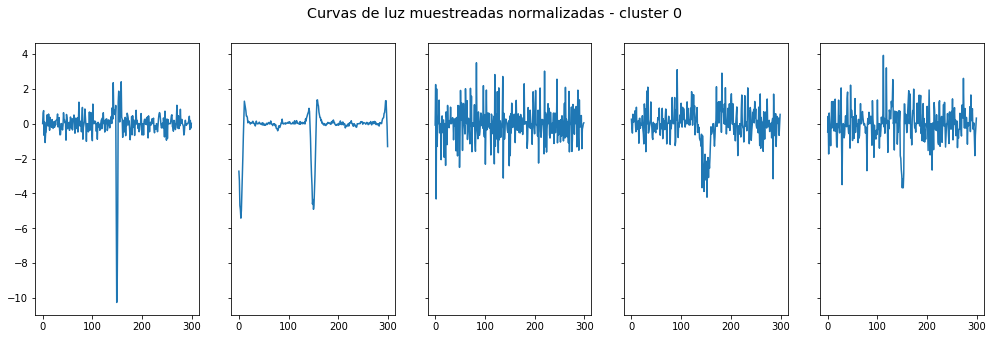

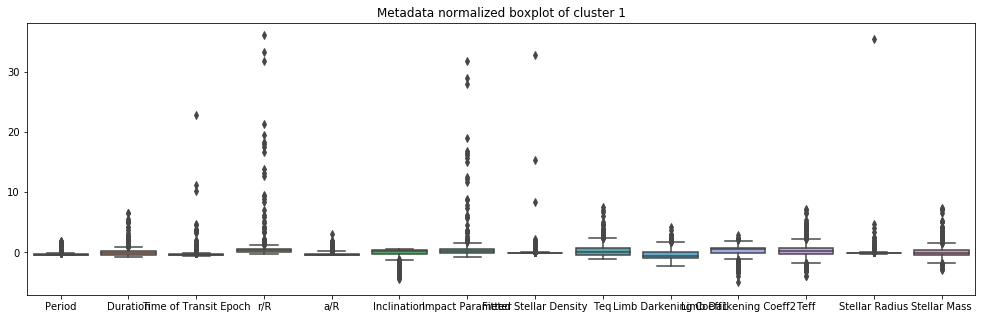

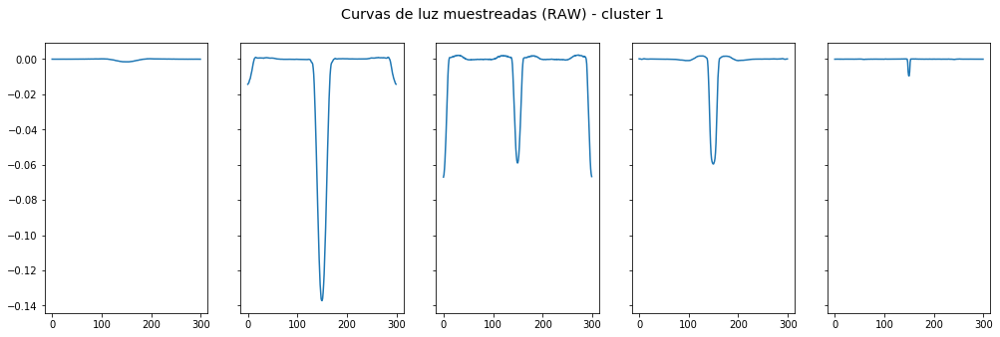

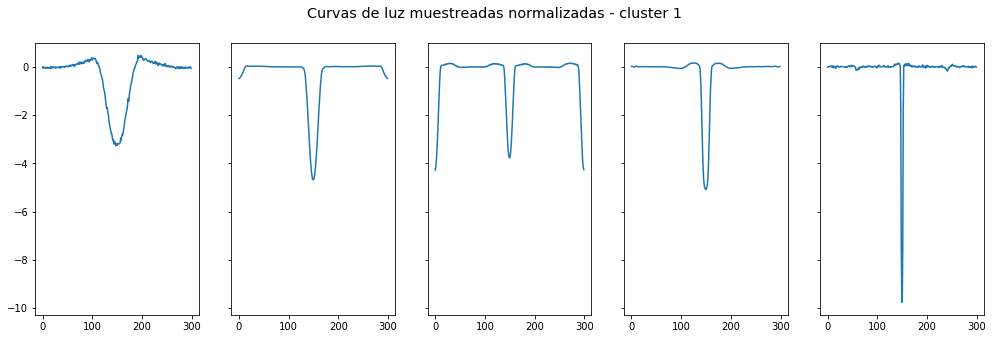

In [82]:
df_clus_i = visualize_clusters(clus_l) #Birc K=2

In [83]:
df_clus_i

,#data,CONF_ratio,CAND_ratio,Period,Duration,Time of Transit Epoch,r/R,a/R,Inclination,Impact Parameter,Fitted Stellar Density,Teq,Limb Darkening Coeff1,Limb Darkening Coeff2,Teff,Stellar Radius,Stellar Mass
0,6628,0.451012,0.262372,42.222594,0.223376,160.015169,0.064674,41.107115,82.378229,0.553987,3.960774,1096.930385,0.417737,0.249535,5640.270862,1.744073,1.010036
1,1426,0.055556,0.040673,12.528787,0.226867,146.106054,0.574107,18.260313,80.496095,0.920598,2.766625,1351.633475,0.376011,0.269911,5929.120056,1.571802,1.040923
